# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

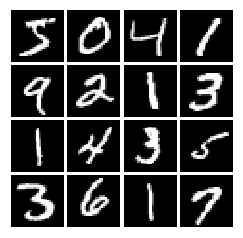

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    return tf.maximum(x, alpha*x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     pass
    return tf.random.uniform(shape=[batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, activation='tanh'),


        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss_r = bce(tf.ones(logits_real.shape), logits_real)
    loss_f = bce(tf.zeros(logits_fake.shape), logits_fake)
    loss = loss_r + loss_f
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones(logits_fake.shape), logits_fake)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.378, G:0.715
Instructions for updating:
Use tf.identity instead.


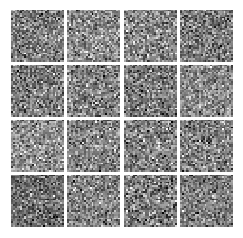

Epoch: 0, Iter: 20, D: 0.6148, G:0.9199


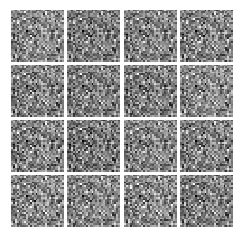

Epoch: 0, Iter: 40, D: 0.4637, G:1.381


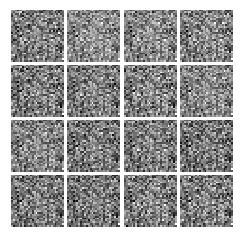

Epoch: 0, Iter: 60, D: 1.515, G:1.23


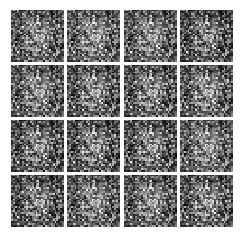

Epoch: 0, Iter: 80, D: 1.387, G:1.121


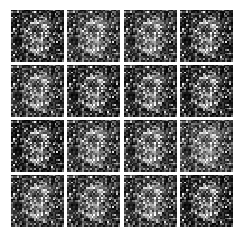

Epoch: 0, Iter: 100, D: 1.117, G:1.715


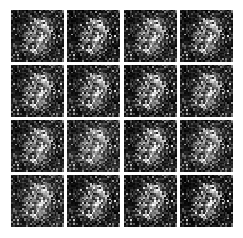

Epoch: 0, Iter: 120, D: 1.27, G:0.8423


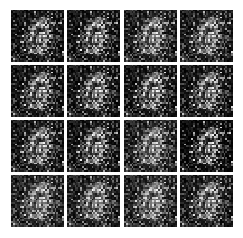

Epoch: 0, Iter: 140, D: 0.8783, G:1.937


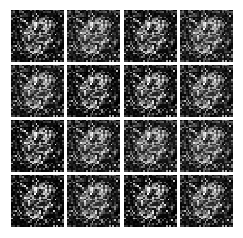

Epoch: 0, Iter: 160, D: 2.111, G:0.7166


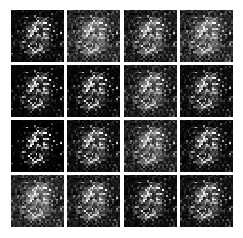

Epoch: 0, Iter: 180, D: 0.9742, G:1.089


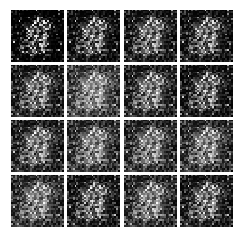

Epoch: 0, Iter: 200, D: 1.756, G:1.24


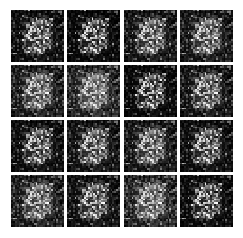

Epoch: 0, Iter: 220, D: 0.9401, G:1.531


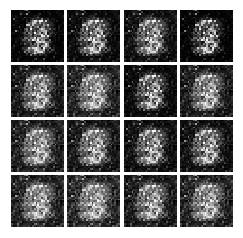

Epoch: 0, Iter: 240, D: 2.253, G:1.359


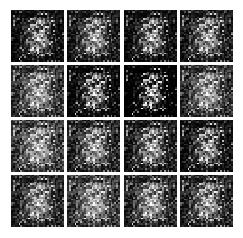

Epoch: 0, Iter: 260, D: 1.852, G:0.9709


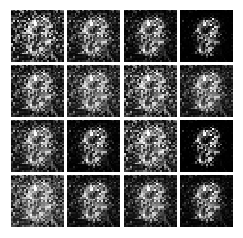

Epoch: 0, Iter: 280, D: 1.147, G:1.176


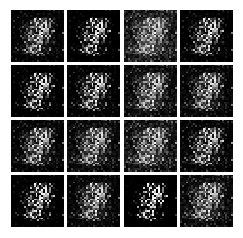

Epoch: 0, Iter: 300, D: 1.739, G:2.252


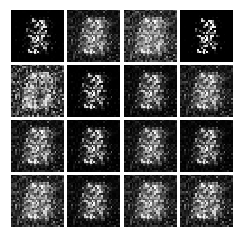

Epoch: 0, Iter: 320, D: 1.404, G:1.607


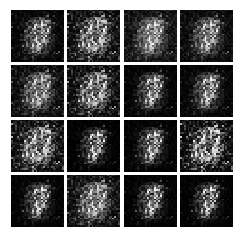

Epoch: 0, Iter: 340, D: 1.415, G:0.9


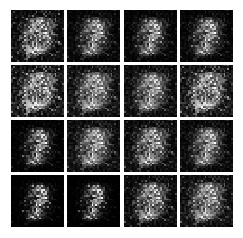

Epoch: 0, Iter: 360, D: 1.23, G:1.708


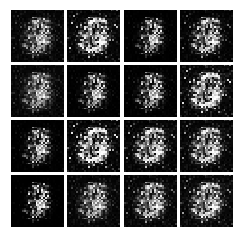

Epoch: 0, Iter: 380, D: 1.167, G:0.9916


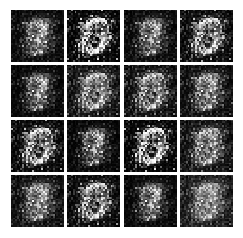

Epoch: 0, Iter: 400, D: 1.417, G:1.176


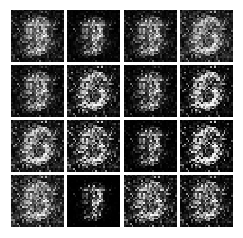

Epoch: 0, Iter: 420, D: 1.366, G:1.762


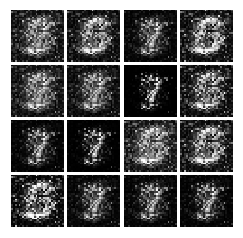

Epoch: 0, Iter: 440, D: 1.394, G:1.319


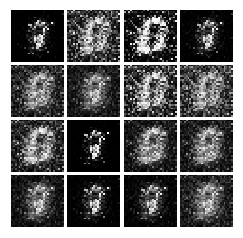

Epoch: 0, Iter: 460, D: 1.016, G:2.295


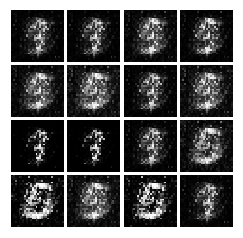

Epoch: 1, Iter: 480, D: 1.034, G:1.416


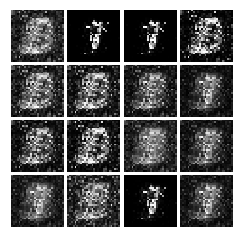

Epoch: 1, Iter: 500, D: 1.044, G:1.564


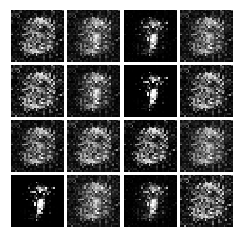

Epoch: 1, Iter: 520, D: 0.8114, G:1.66


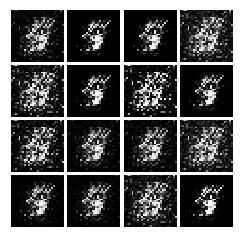

Epoch: 1, Iter: 540, D: 1.258, G:1.481


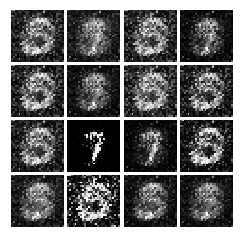

Epoch: 1, Iter: 560, D: 1.269, G:3.522


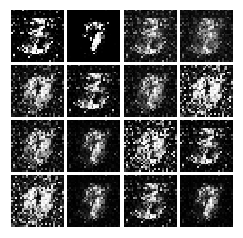

Epoch: 1, Iter: 580, D: 0.9301, G:2.301


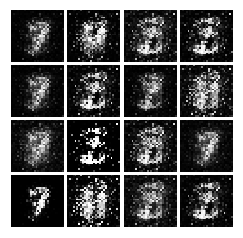

Epoch: 1, Iter: 600, D: 1.059, G:1.338


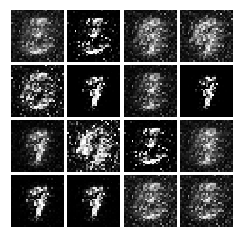

Epoch: 1, Iter: 620, D: 0.9985, G:1.472


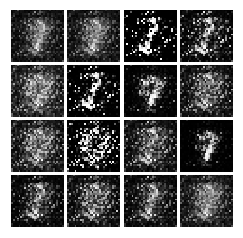

Epoch: 1, Iter: 640, D: 1.045, G:1.614


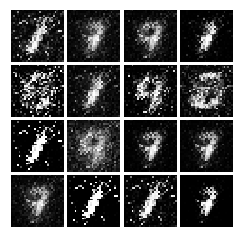

Epoch: 1, Iter: 660, D: 1.299, G:1.987


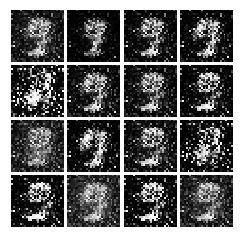

Epoch: 1, Iter: 680, D: 1.249, G:1.697


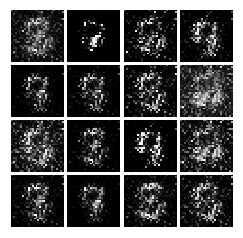

Epoch: 1, Iter: 700, D: 1.316, G:1.017


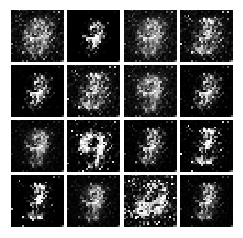

Epoch: 1, Iter: 720, D: 0.9586, G:1.558


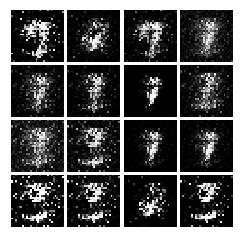

Epoch: 1, Iter: 740, D: 1.017, G:1.255


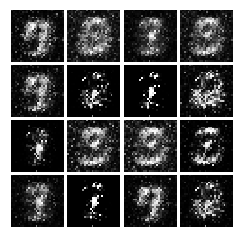

Epoch: 1, Iter: 760, D: 0.867, G:1.118


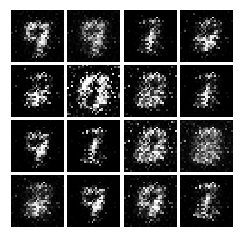

Epoch: 1, Iter: 780, D: 1.8, G:3.449


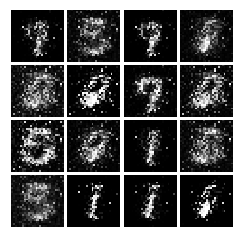

Epoch: 1, Iter: 800, D: 1.268, G:1.126


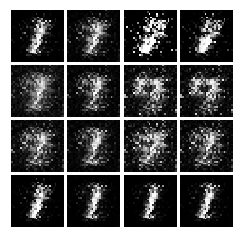

Epoch: 1, Iter: 820, D: 0.8743, G:1.994


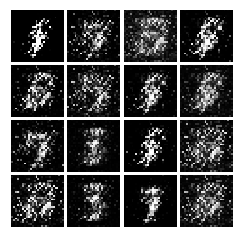

Epoch: 1, Iter: 840, D: 1.313, G:1.469


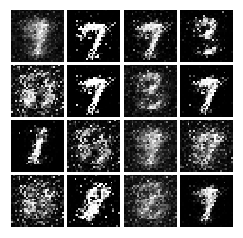

Epoch: 1, Iter: 860, D: 1.1, G:1.287


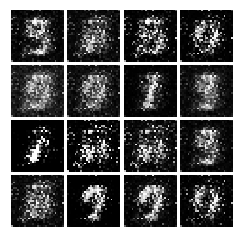

Epoch: 1, Iter: 880, D: 1.296, G:2.522


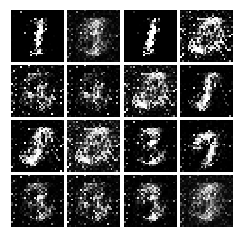

Epoch: 1, Iter: 900, D: 1.023, G:1.675


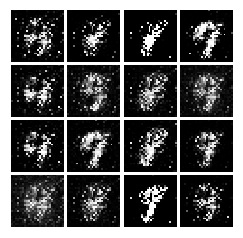

Epoch: 1, Iter: 920, D: 1.468, G:1.683


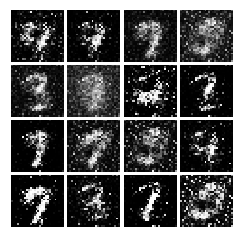

Epoch: 2, Iter: 940, D: 1.248, G:2.643


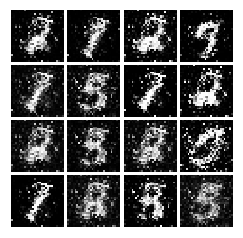

Epoch: 2, Iter: 960, D: 1.161, G:1.155


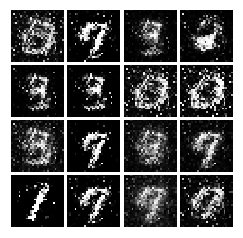

Epoch: 2, Iter: 980, D: 0.9583, G:1.181


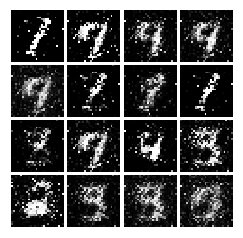

Epoch: 2, Iter: 1000, D: 1.085, G:1.283


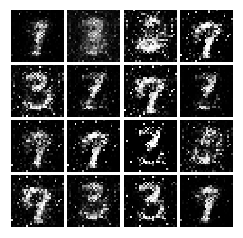

Epoch: 2, Iter: 1020, D: 1.163, G:1.033


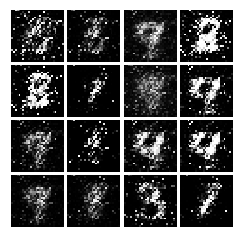

Epoch: 2, Iter: 1040, D: 1.098, G:1.348


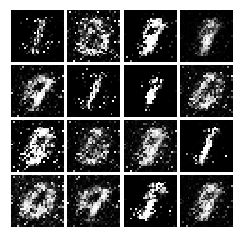

Epoch: 2, Iter: 1060, D: 1.188, G:0.973


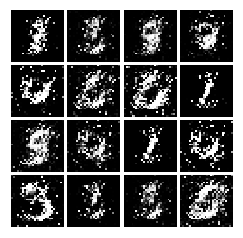

Epoch: 2, Iter: 1080, D: 0.9433, G:1.057


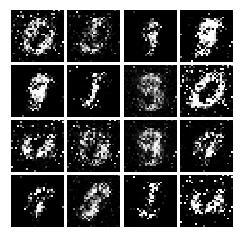

Epoch: 2, Iter: 1100, D: 1.312, G:3.141


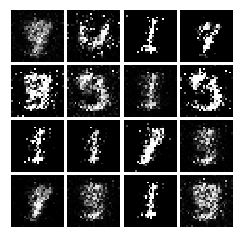

Epoch: 2, Iter: 1120, D: 1.015, G:1.53


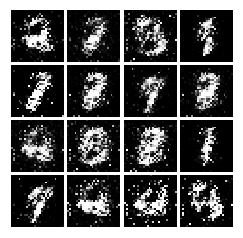

Epoch: 2, Iter: 1140, D: 1.792, G:1.421


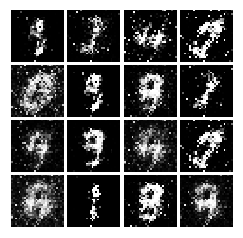

Epoch: 2, Iter: 1160, D: 1.107, G:1.635


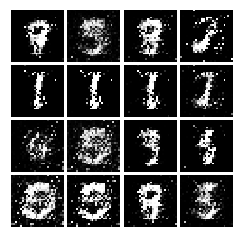

Epoch: 2, Iter: 1180, D: 1.378, G:1.74


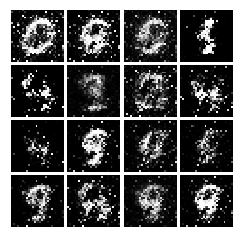

Epoch: 2, Iter: 1200, D: 1.266, G:0.958


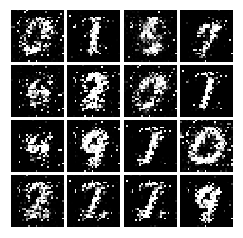

Epoch: 2, Iter: 1220, D: 1.205, G:1.502


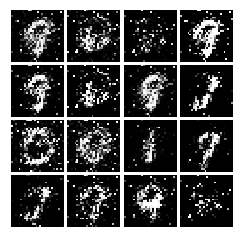

Epoch: 2, Iter: 1240, D: 1.106, G:1.309


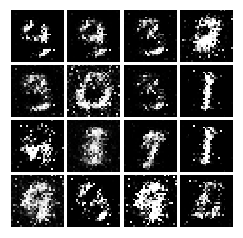

Epoch: 2, Iter: 1260, D: 1.207, G:1.103


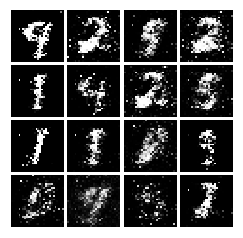

Epoch: 2, Iter: 1280, D: 1.189, G:1.322


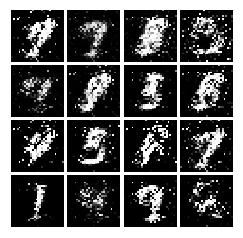

Epoch: 2, Iter: 1300, D: 0.9939, G:0.8985


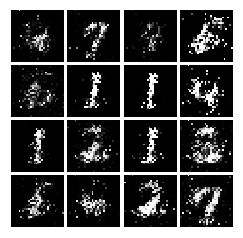

Epoch: 2, Iter: 1320, D: 1.373, G:1.018


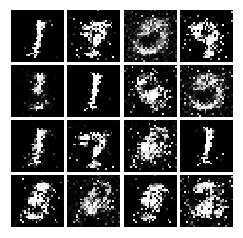

Epoch: 2, Iter: 1340, D: 1.47, G:0.9982


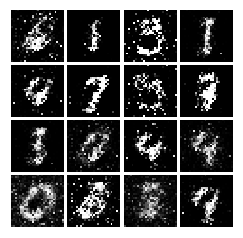

Epoch: 2, Iter: 1360, D: 1.163, G:1.299


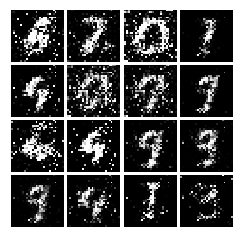

Epoch: 2, Iter: 1380, D: 1.336, G:1.14


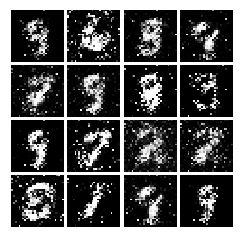

Epoch: 2, Iter: 1400, D: 1.015, G:0.9955


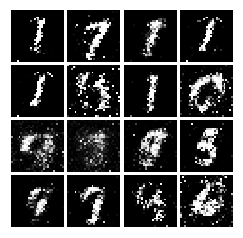

Epoch: 3, Iter: 1420, D: 1.25, G:1.007


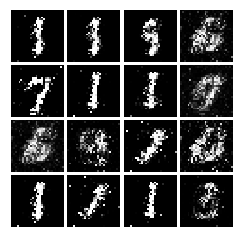

Epoch: 3, Iter: 1440, D: 1.005, G:1.266


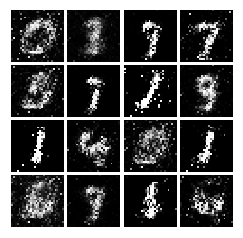

Epoch: 3, Iter: 1460, D: 1.185, G:1.722


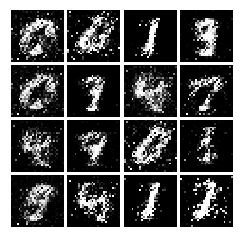

Epoch: 3, Iter: 1480, D: 1.338, G:1.045


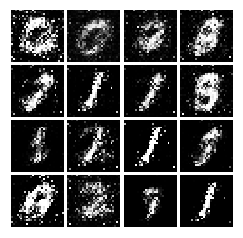

Epoch: 3, Iter: 1500, D: 1.348, G:0.9188


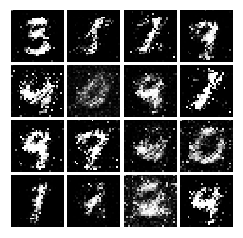

Epoch: 3, Iter: 1520, D: 1.319, G:0.7422


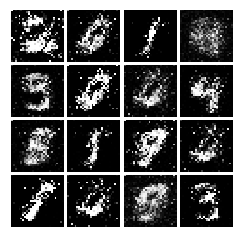

Epoch: 3, Iter: 1540, D: 1.254, G:0.8905


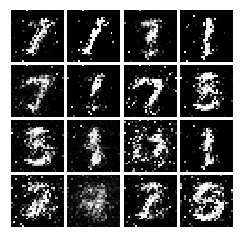

Epoch: 3, Iter: 1560, D: 1.206, G:1.268


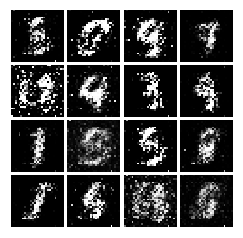

Epoch: 3, Iter: 1580, D: 1.184, G:0.9248


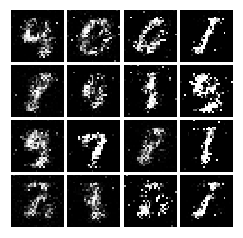

Epoch: 3, Iter: 1600, D: 1.243, G:1.033


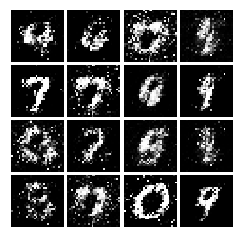

Epoch: 3, Iter: 1620, D: 1.154, G:1.148


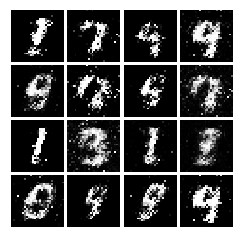

Epoch: 3, Iter: 1640, D: 1.369, G:1.221


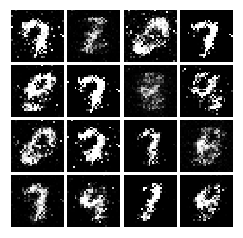

Epoch: 3, Iter: 1660, D: 1.085, G:1.186


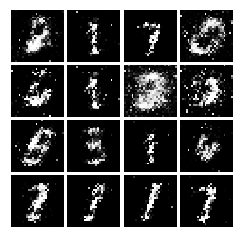

Epoch: 3, Iter: 1680, D: 1.302, G:0.8532


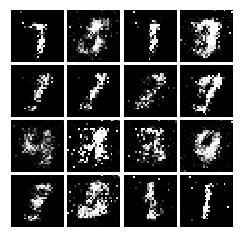

Epoch: 3, Iter: 1700, D: 1.301, G:0.9205


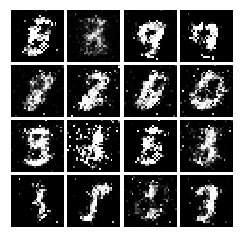

Epoch: 3, Iter: 1720, D: 1.363, G:1.205


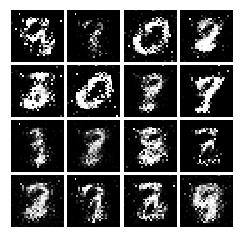

Epoch: 3, Iter: 1740, D: 1.06, G:1.311


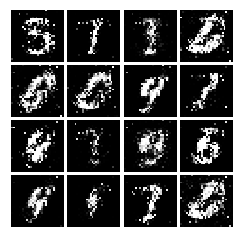

Epoch: 3, Iter: 1760, D: 1.292, G:0.9079


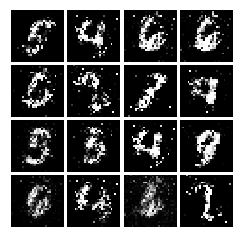

Epoch: 3, Iter: 1780, D: 1.261, G:0.8572


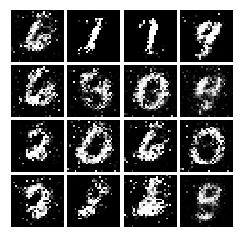

Epoch: 3, Iter: 1800, D: 1.194, G:0.9736


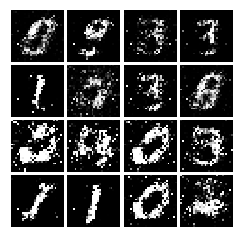

Epoch: 3, Iter: 1820, D: 1.27, G:0.8533


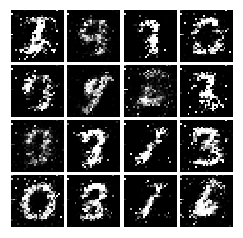

Epoch: 3, Iter: 1840, D: 1.373, G:0.8772


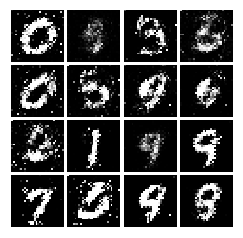

Epoch: 3, Iter: 1860, D: 1.368, G:1.44


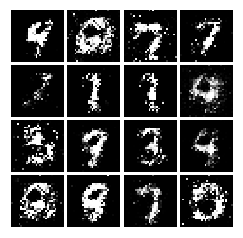

Epoch: 4, Iter: 1880, D: 1.156, G:0.9668


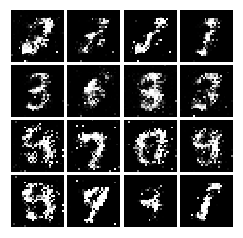

Epoch: 4, Iter: 1900, D: 1.247, G:0.9433


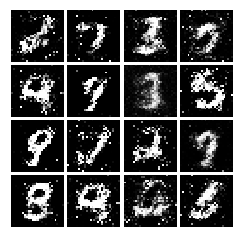

Epoch: 4, Iter: 1920, D: 1.152, G:1.117


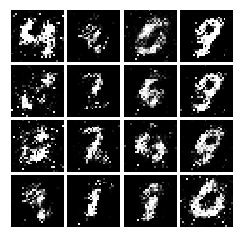

Epoch: 4, Iter: 1940, D: 1.226, G:0.965


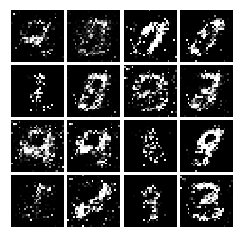

Epoch: 4, Iter: 1960, D: 2.589, G:0.9081


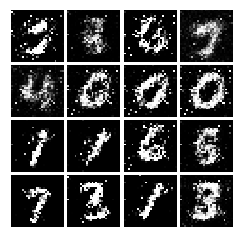

Epoch: 4, Iter: 1980, D: 1.236, G:0.9082


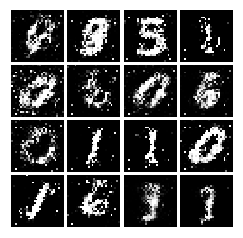

Epoch: 4, Iter: 2000, D: 1.371, G:0.9189


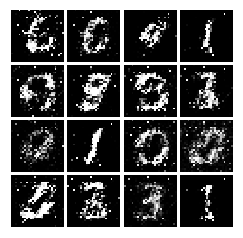

Epoch: 4, Iter: 2020, D: 1.217, G:1.054


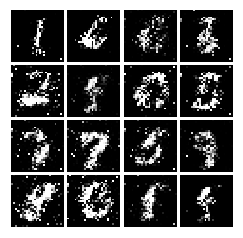

Epoch: 4, Iter: 2040, D: 1.302, G:0.8889


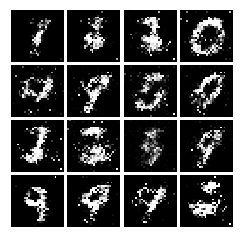

Epoch: 4, Iter: 2060, D: 1.361, G:1.176


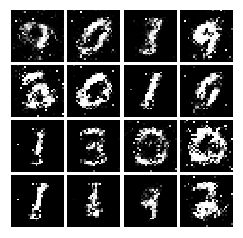

Epoch: 4, Iter: 2080, D: 1.28, G:0.8783


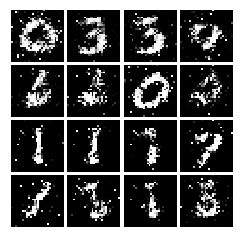

Epoch: 4, Iter: 2100, D: 1.356, G:0.9413


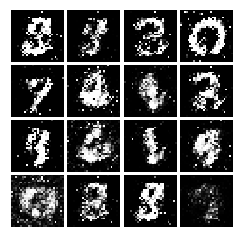

Epoch: 4, Iter: 2120, D: 1.259, G:0.8899


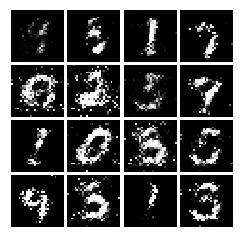

Epoch: 4, Iter: 2140, D: 1.295, G:0.8607


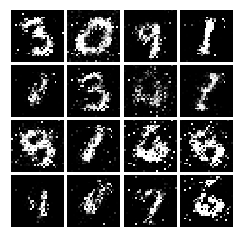

Epoch: 4, Iter: 2160, D: 1.38, G:0.9259


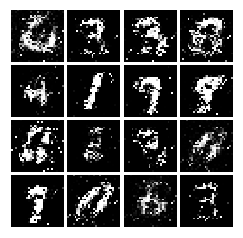

Epoch: 4, Iter: 2180, D: 1.238, G:1.006


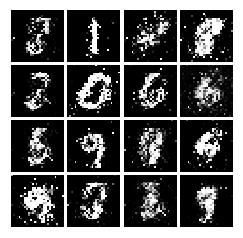

Epoch: 4, Iter: 2200, D: 1.222, G:0.6881


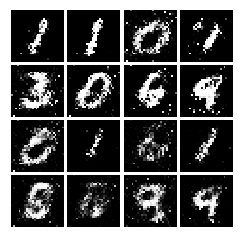

Epoch: 4, Iter: 2220, D: 1.235, G:0.9824


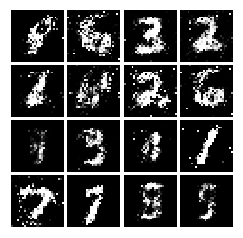

Epoch: 4, Iter: 2240, D: 1.266, G:0.8564


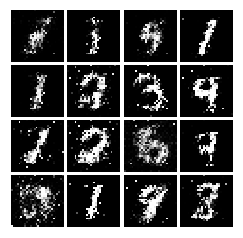

Epoch: 4, Iter: 2260, D: 1.306, G:1.075


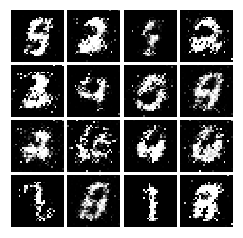

Epoch: 4, Iter: 2280, D: 1.198, G:1.127


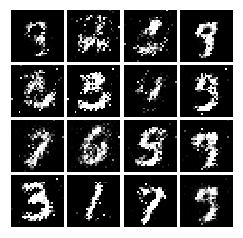

Epoch: 4, Iter: 2300, D: 1.221, G:0.8746


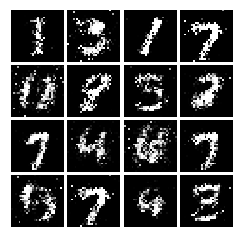

Epoch: 4, Iter: 2320, D: 1.352, G:0.883


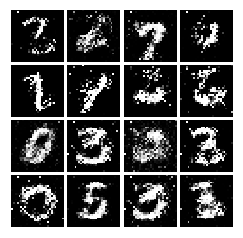

Epoch: 4, Iter: 2340, D: 1.22, G:1.21


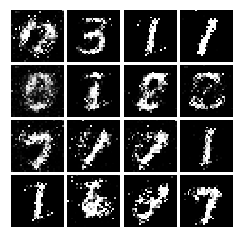

Epoch: 5, Iter: 2360, D: 1.198, G:0.8977


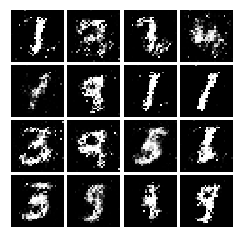

Epoch: 5, Iter: 2380, D: 1.222, G:0.9043


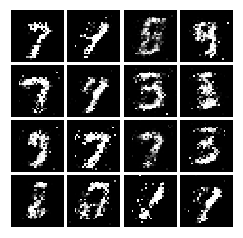

Epoch: 5, Iter: 2400, D: 1.307, G:1.048


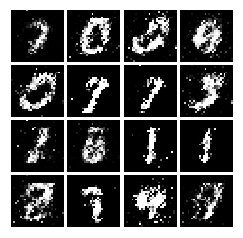

Epoch: 5, Iter: 2420, D: 1.388, G:0.9493


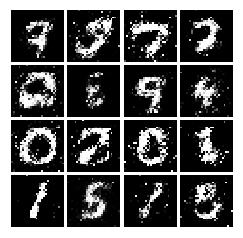

Epoch: 5, Iter: 2440, D: 1.211, G:0.8884


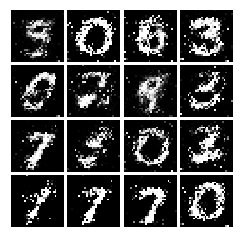

Epoch: 5, Iter: 2460, D: 1.147, G:1.162


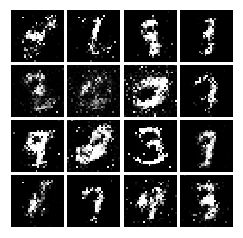

Epoch: 5, Iter: 2480, D: 1.33, G:0.8177


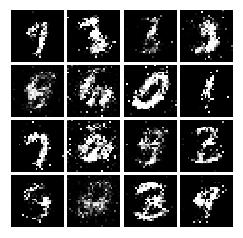

Epoch: 5, Iter: 2500, D: 1.062, G:1.325


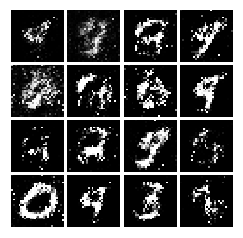

Epoch: 5, Iter: 2520, D: 1.377, G:0.7888


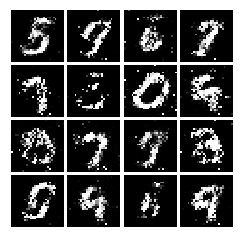

Epoch: 5, Iter: 2540, D: 1.302, G:0.7597


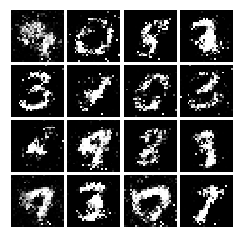

Epoch: 5, Iter: 2560, D: 1.356, G:0.8122


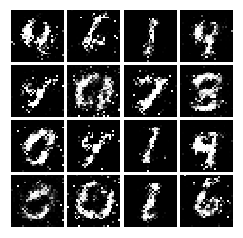

Epoch: 5, Iter: 2580, D: 1.249, G:0.848


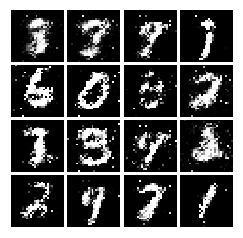

Epoch: 5, Iter: 2600, D: 1.415, G:0.7197


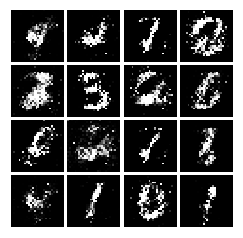

Epoch: 5, Iter: 2620, D: 1.312, G:0.8438


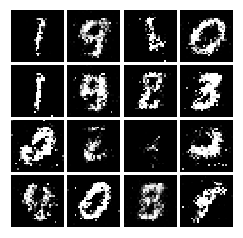

Epoch: 5, Iter: 2640, D: 1.371, G:0.8619


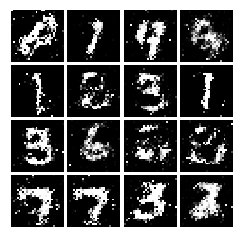

Epoch: 5, Iter: 2660, D: 1.284, G:0.8899


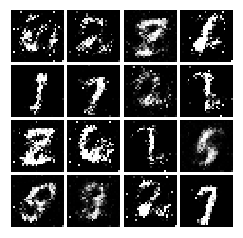

Epoch: 5, Iter: 2680, D: 1.382, G:0.8615


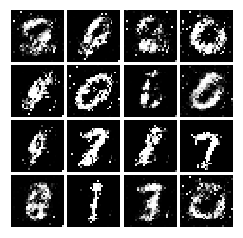

Epoch: 5, Iter: 2700, D: 1.23, G:0.8416


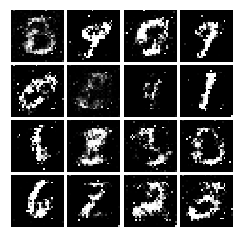

Epoch: 5, Iter: 2720, D: 1.239, G:0.9047


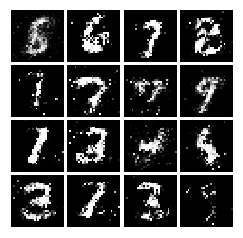

Epoch: 5, Iter: 2740, D: 1.305, G:0.9281


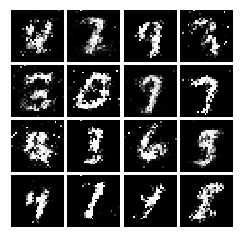

Epoch: 5, Iter: 2760, D: 1.378, G:0.8499


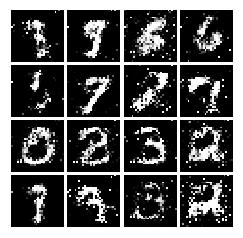

Epoch: 5, Iter: 2780, D: 1.242, G:0.7745


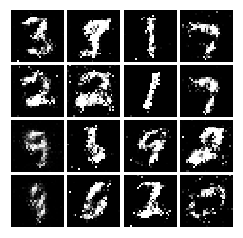

Epoch: 5, Iter: 2800, D: 1.181, G:0.9455


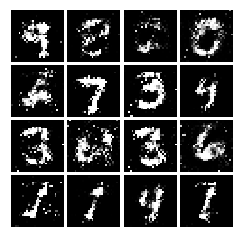

Epoch: 6, Iter: 2820, D: 1.331, G:0.7346


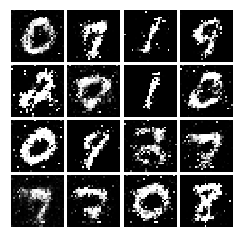

Epoch: 6, Iter: 2840, D: 1.341, G:0.8468


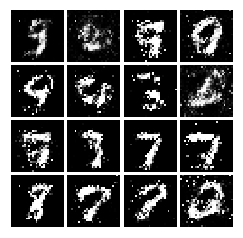

Epoch: 6, Iter: 2860, D: 1.23, G:0.8474


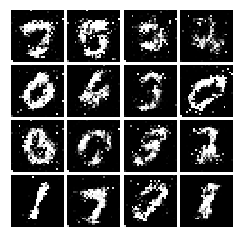

Epoch: 6, Iter: 2880, D: 1.241, G:0.9907


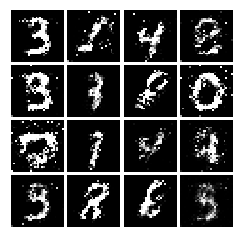

Epoch: 6, Iter: 2900, D: 1.327, G:0.8788


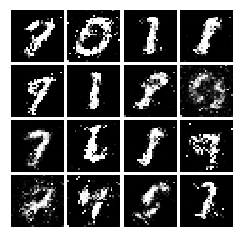

Epoch: 6, Iter: 2920, D: 1.415, G:0.7733


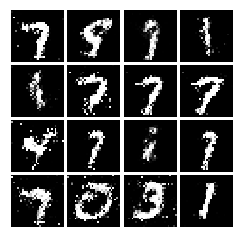

Epoch: 6, Iter: 2940, D: 1.255, G:0.7681


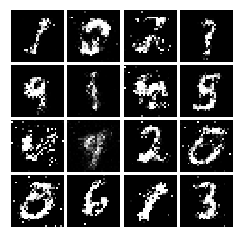

Epoch: 6, Iter: 2960, D: 1.229, G:0.8413


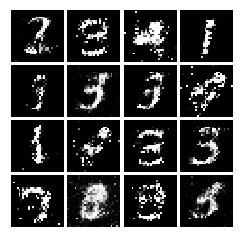

Epoch: 6, Iter: 2980, D: 1.34, G:0.7996


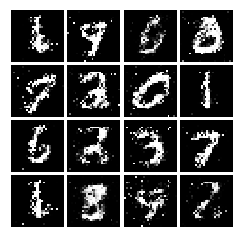

Epoch: 6, Iter: 3000, D: 1.274, G:0.9059


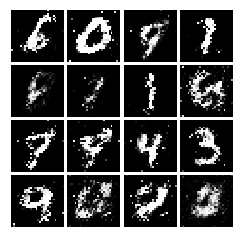

Epoch: 6, Iter: 3020, D: 1.342, G:0.8987


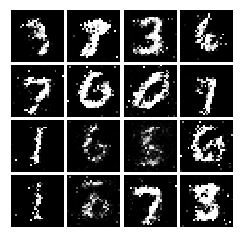

Epoch: 6, Iter: 3040, D: 1.426, G:0.8948


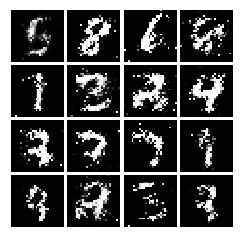

Epoch: 6, Iter: 3060, D: 1.382, G:0.8949


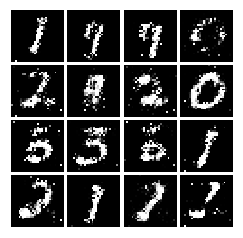

Epoch: 6, Iter: 3080, D: 1.375, G:0.5746


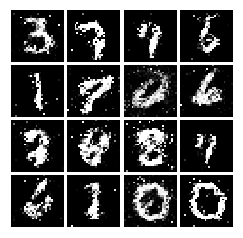

Epoch: 6, Iter: 3100, D: 1.34, G:0.8314


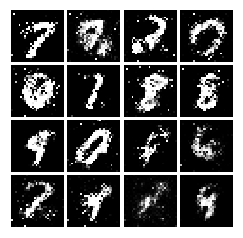

Epoch: 6, Iter: 3120, D: 1.316, G:0.7424


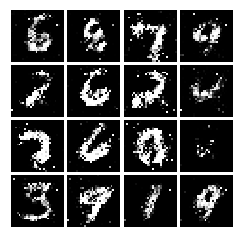

Epoch: 6, Iter: 3140, D: 1.353, G:0.8242


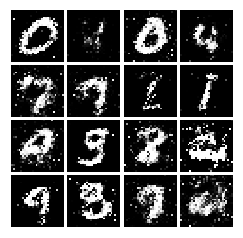

Epoch: 6, Iter: 3160, D: 1.261, G:0.7863


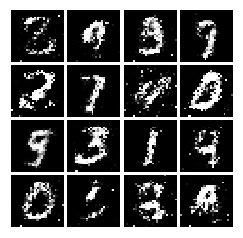

Epoch: 6, Iter: 3180, D: 1.227, G:0.9616


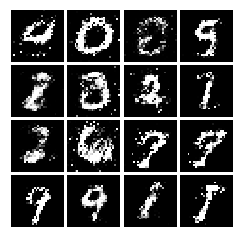

Epoch: 6, Iter: 3200, D: 1.312, G:0.8511


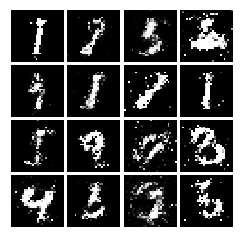

Epoch: 6, Iter: 3220, D: 1.435, G:0.8155


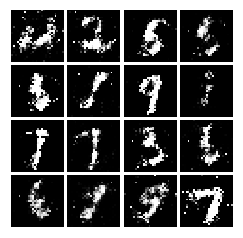

Epoch: 6, Iter: 3240, D: 1.309, G:0.7457


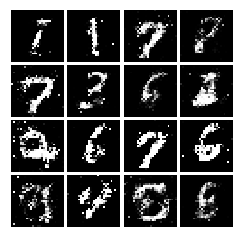

Epoch: 6, Iter: 3260, D: 1.345, G:0.7931


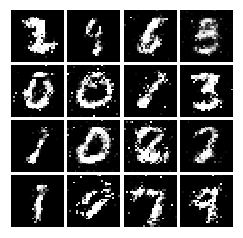

Epoch: 6, Iter: 3280, D: 1.385, G:0.7396


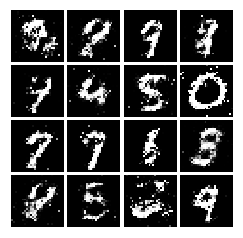

Epoch: 7, Iter: 3300, D: 1.329, G:0.8506


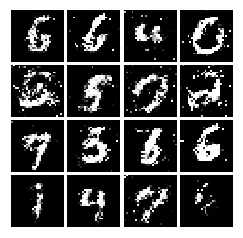

Epoch: 7, Iter: 3320, D: 1.298, G:0.8262


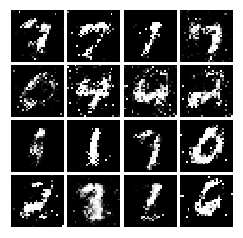

Epoch: 7, Iter: 3340, D: 1.265, G:0.8658


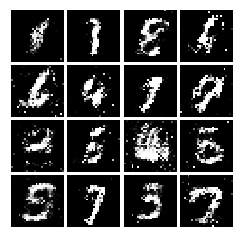

Epoch: 7, Iter: 3360, D: 1.294, G:0.9029


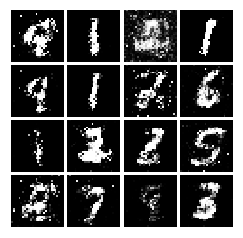

Epoch: 7, Iter: 3380, D: 1.243, G:0.8062


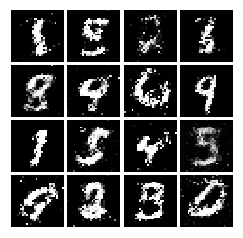

Epoch: 7, Iter: 3400, D: 1.343, G:0.8706


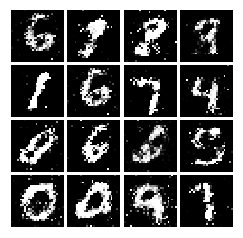

Epoch: 7, Iter: 3420, D: 1.297, G:0.7973


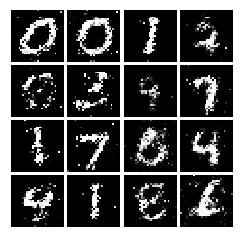

Epoch: 7, Iter: 3440, D: 1.215, G:0.8515


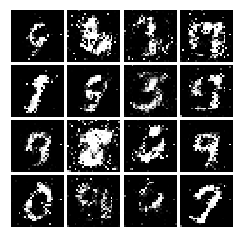

Epoch: 7, Iter: 3460, D: 1.367, G:0.7584


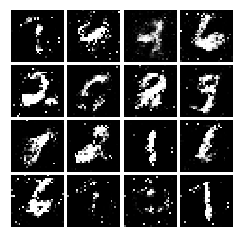

Epoch: 7, Iter: 3480, D: 1.287, G:0.7818


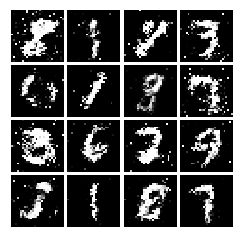

Epoch: 7, Iter: 3500, D: 1.416, G:0.8828


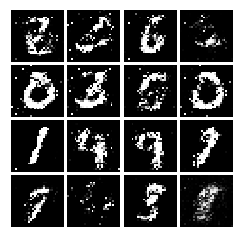

Epoch: 7, Iter: 3520, D: 1.429, G:0.7291


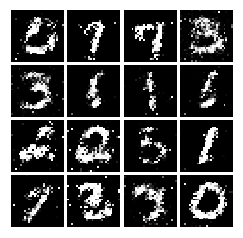

Epoch: 7, Iter: 3540, D: 1.328, G:0.7966


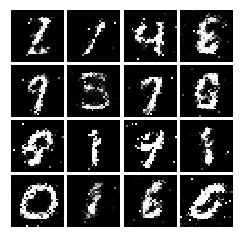

Epoch: 7, Iter: 3560, D: 1.237, G:0.8756


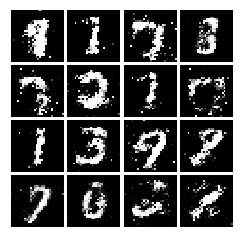

Epoch: 7, Iter: 3580, D: 1.327, G:0.8183


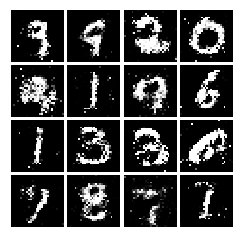

Epoch: 7, Iter: 3600, D: 1.324, G:0.7152


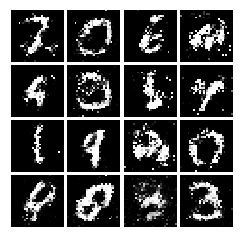

Epoch: 7, Iter: 3620, D: 1.397, G:0.8038


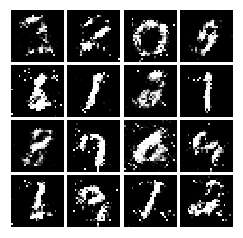

Epoch: 7, Iter: 3640, D: 1.274, G:0.8814


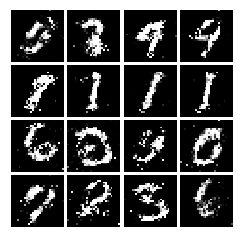

Epoch: 7, Iter: 3660, D: 1.292, G:0.7448


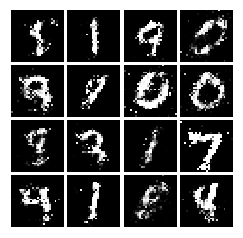

Epoch: 7, Iter: 3680, D: 1.388, G:0.841


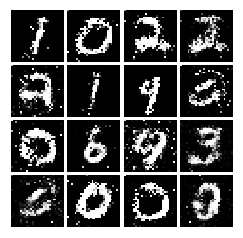

Epoch: 7, Iter: 3700, D: 1.282, G:0.8598


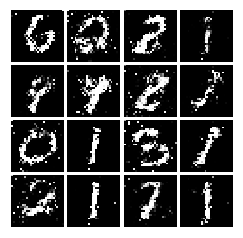

Epoch: 7, Iter: 3720, D: 1.285, G:0.7878


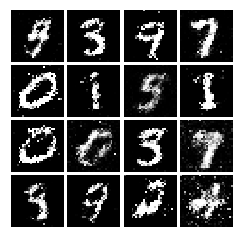

Epoch: 7, Iter: 3740, D: 1.302, G:0.8056


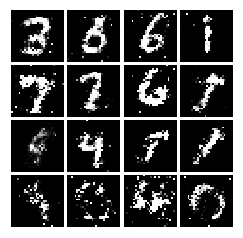

Epoch: 8, Iter: 3760, D: 1.367, G:0.7276


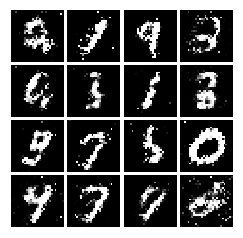

Epoch: 8, Iter: 3780, D: 1.29, G:0.894


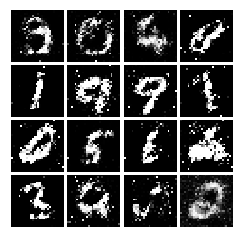

Epoch: 8, Iter: 3800, D: 1.255, G:0.9025


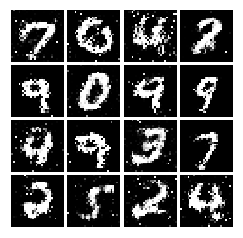

Epoch: 8, Iter: 3820, D: 1.42, G:0.7742


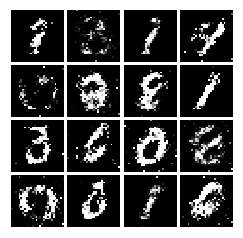

Epoch: 8, Iter: 3840, D: 1.32, G:0.7829


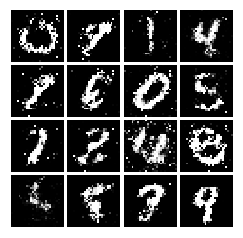

Epoch: 8, Iter: 3860, D: 1.306, G:0.8498


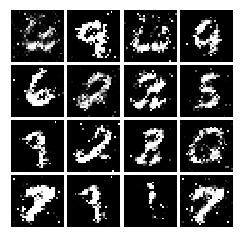

Epoch: 8, Iter: 3880, D: 1.258, G:0.7875


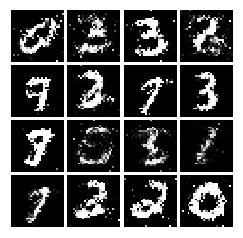

Epoch: 8, Iter: 3900, D: 1.34, G:0.8791


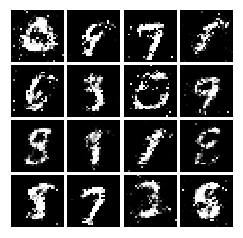

Epoch: 8, Iter: 3920, D: 1.303, G:0.7435


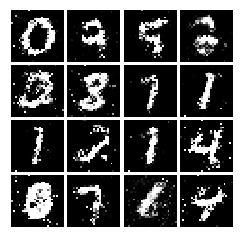

Epoch: 8, Iter: 3940, D: 1.327, G:0.7219


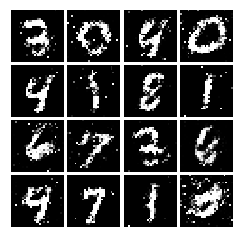

Epoch: 8, Iter: 3960, D: 1.254, G:0.8317


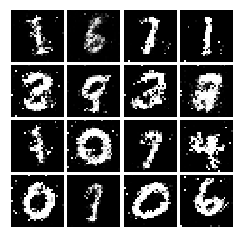

Epoch: 8, Iter: 3980, D: 1.324, G:0.8051


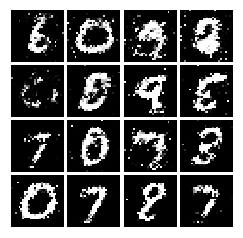

Epoch: 8, Iter: 4000, D: 1.288, G:1.05


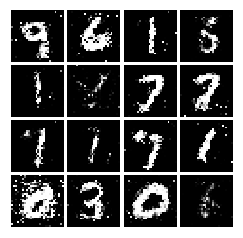

Epoch: 8, Iter: 4020, D: 1.355, G:0.7948


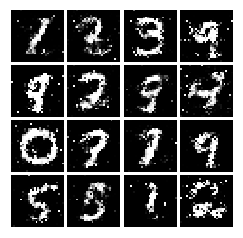

Epoch: 8, Iter: 4040, D: 1.332, G:0.838


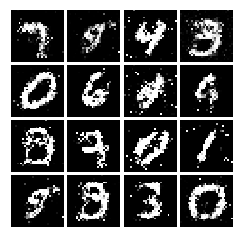

Epoch: 8, Iter: 4060, D: 1.294, G:0.9923


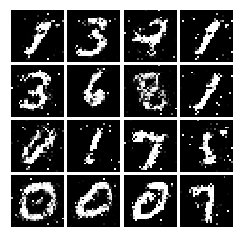

Epoch: 8, Iter: 4080, D: 1.266, G:0.8863


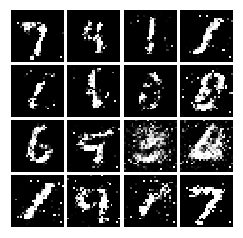

Epoch: 8, Iter: 4100, D: 1.281, G:0.9525


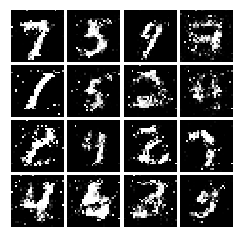

Epoch: 8, Iter: 4120, D: 1.339, G:0.8198


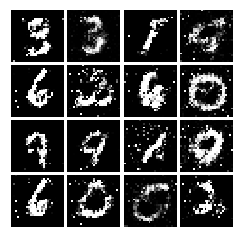

Epoch: 8, Iter: 4140, D: 1.192, G:0.864


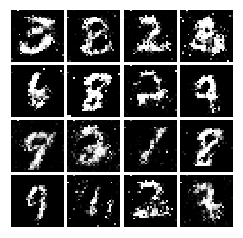

Epoch: 8, Iter: 4160, D: 1.543, G:0.641


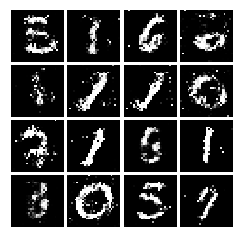

Epoch: 8, Iter: 4180, D: 1.357, G:0.873


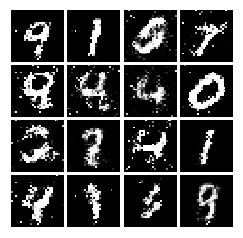

Epoch: 8, Iter: 4200, D: 1.327, G:0.7375


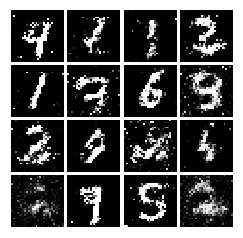

Epoch: 8, Iter: 4220, D: 1.324, G:0.908


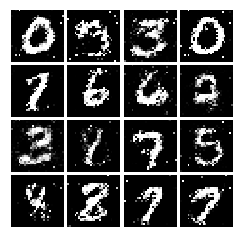

Epoch: 9, Iter: 4240, D: 1.324, G:0.8498


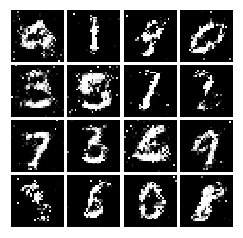

Epoch: 9, Iter: 4260, D: 1.349, G:0.814


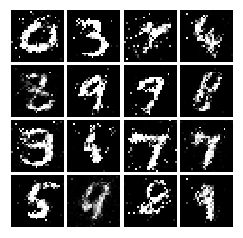

Epoch: 9, Iter: 4280, D: 1.32, G:0.961


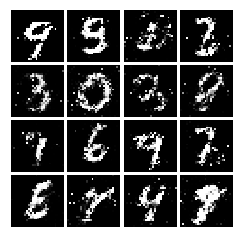

Epoch: 9, Iter: 4300, D: 1.37, G:0.8055


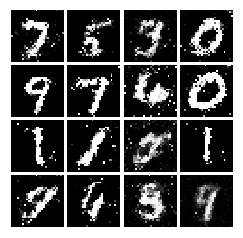

Epoch: 9, Iter: 4320, D: 1.36, G:0.7816


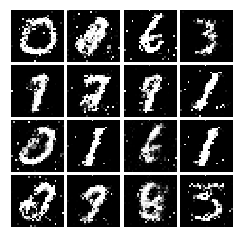

Epoch: 9, Iter: 4340, D: 1.284, G:0.8363


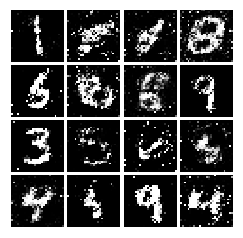

Epoch: 9, Iter: 4360, D: 1.357, G:0.8777


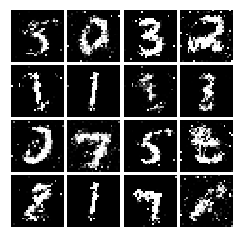

Epoch: 9, Iter: 4380, D: 1.346, G:0.7807


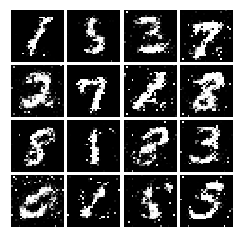

Epoch: 9, Iter: 4400, D: 1.25, G:0.97


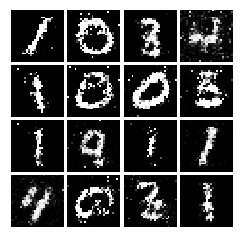

Epoch: 9, Iter: 4420, D: 1.367, G:0.8291


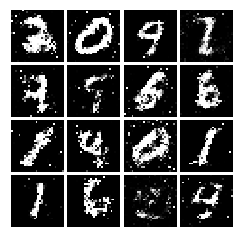

Epoch: 9, Iter: 4440, D: 1.372, G:0.7482


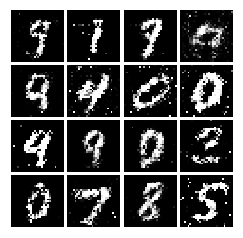

Epoch: 9, Iter: 4460, D: 1.335, G:0.8043


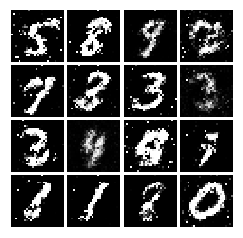

Epoch: 9, Iter: 4480, D: 1.257, G:0.9526


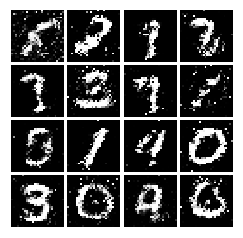

Epoch: 9, Iter: 4500, D: 1.414, G:0.8057


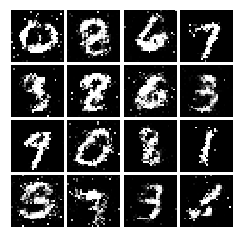

Epoch: 9, Iter: 4520, D: 1.316, G:0.8093


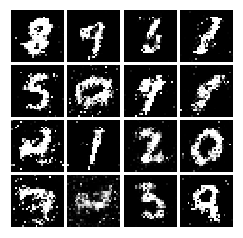

Epoch: 9, Iter: 4540, D: 1.316, G:0.7981


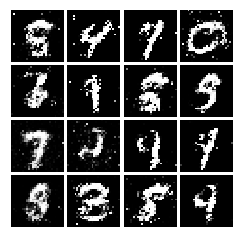

Epoch: 9, Iter: 4560, D: 1.353, G:0.8443


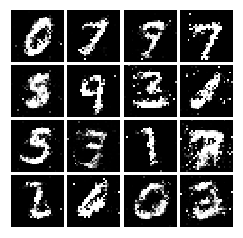

Epoch: 9, Iter: 4580, D: 1.306, G:0.9469


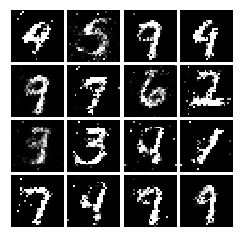

Epoch: 9, Iter: 4600, D: 1.343, G:0.8403


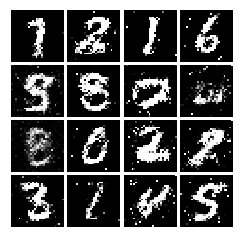

Epoch: 9, Iter: 4620, D: 1.357, G:0.9329


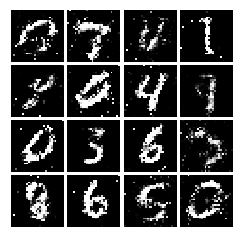

Epoch: 9, Iter: 4640, D: 1.325, G:0.8742


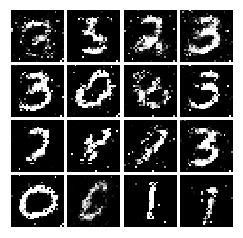

Epoch: 9, Iter: 4660, D: 1.344, G:0.8072


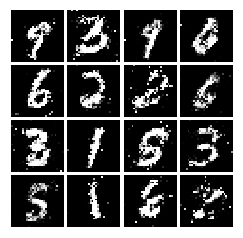

Epoch: 9, Iter: 4680, D: 1.319, G:0.843


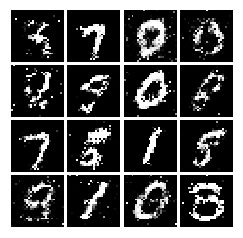

Final images


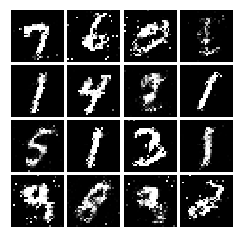

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    N, _ = scores_fake.shape
    loss = 0.5*tf.reduce_mean((scores_real-1)**2) + 0.5*tf.reduce_mean((scores_fake)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    N, _ = scores_fake.shape
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    loss = tf.reduce_mean(0.5*((scores_fake-1)**2))
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1366, G:0.5658


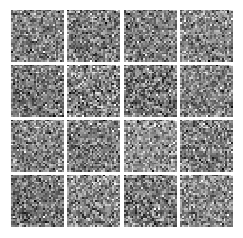

Epoch: 0, Iter: 20, D: 0.03523, G:0.6097


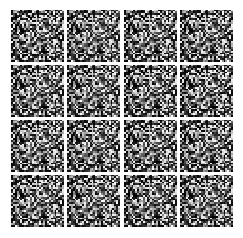

Epoch: 0, Iter: 40, D: 0.02024, G:0.6799


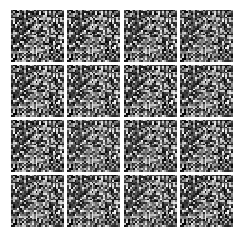

Epoch: 0, Iter: 60, D: 0.08559, G:0.8757


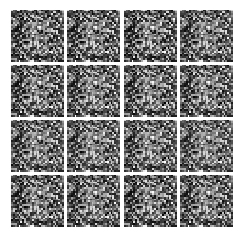

Epoch: 0, Iter: 80, D: 0.03134, G:0.7462


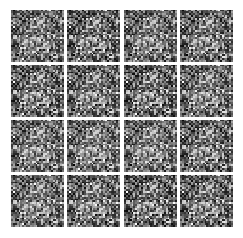

Epoch: 0, Iter: 100, D: 0.1071, G:0.3775


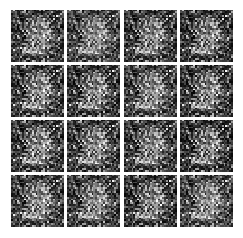

Epoch: 0, Iter: 120, D: 0.06553, G:0.5713


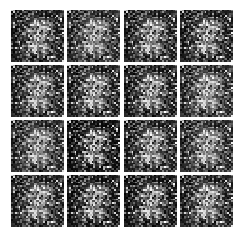

Epoch: 0, Iter: 140, D: 0.1634, G:0.6565


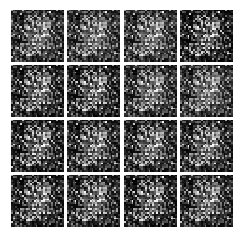

Epoch: 0, Iter: 160, D: 0.1148, G:0.5015


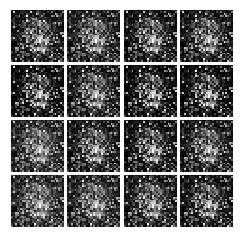

Epoch: 0, Iter: 180, D: 0.2932, G:0.3873


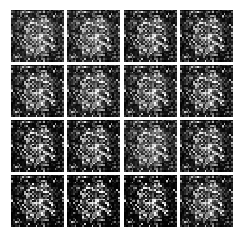

Epoch: 0, Iter: 200, D: 0.2156, G:0.5474


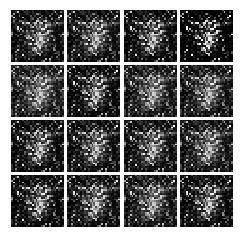

Epoch: 0, Iter: 220, D: 0.112, G:0.6817


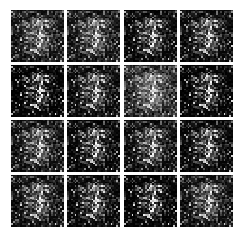

Epoch: 0, Iter: 240, D: 0.09406, G:0.4634


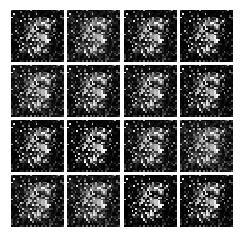

Epoch: 0, Iter: 260, D: 0.2383, G:0.3597


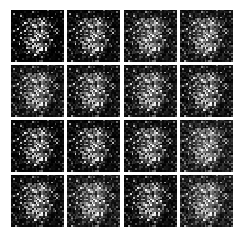

Epoch: 0, Iter: 280, D: 0.0814, G:0.4715


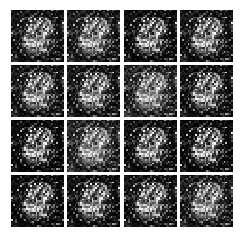

Epoch: 0, Iter: 300, D: 0.162, G:0.3505


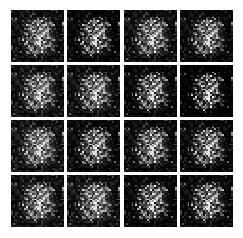

Epoch: 0, Iter: 320, D: 0.07201, G:0.4108


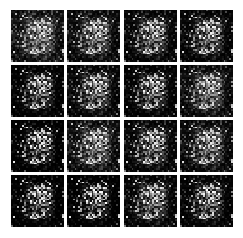

Epoch: 0, Iter: 340, D: 0.1093, G:0.4091


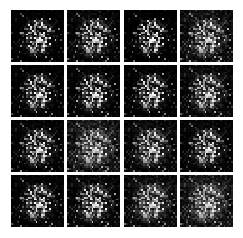

Epoch: 0, Iter: 360, D: 0.08787, G:0.4958


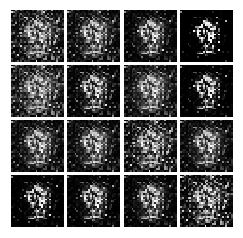

Epoch: 0, Iter: 380, D: 0.1824, G:0.3869


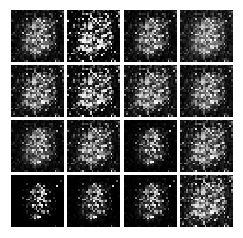

Epoch: 0, Iter: 400, D: 0.3309, G:1.187


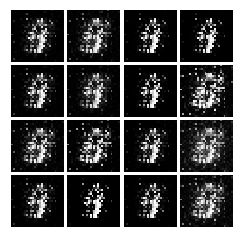

Epoch: 0, Iter: 420, D: 0.1997, G:0.3441


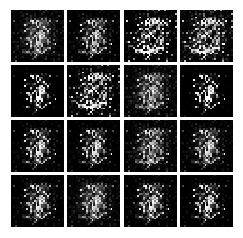

Epoch: 0, Iter: 440, D: 0.1924, G:0.388


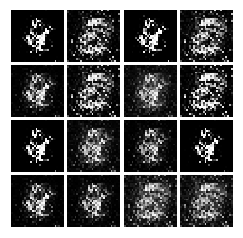

Epoch: 0, Iter: 460, D: 0.07542, G:0.6085


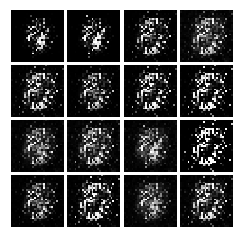

Epoch: 1, Iter: 480, D: 0.09021, G:0.4532


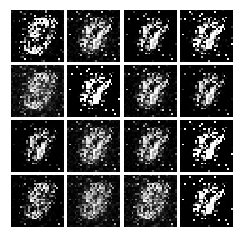

Epoch: 1, Iter: 500, D: 0.1457, G:1.312


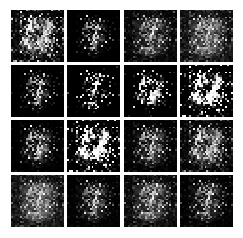

Epoch: 1, Iter: 520, D: 0.9115, G:0.1039


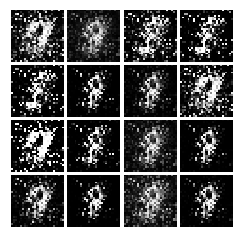

Epoch: 1, Iter: 540, D: 0.1141, G:0.3674


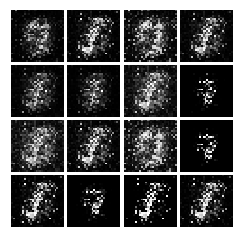

Epoch: 1, Iter: 560, D: 0.1427, G:0.3062


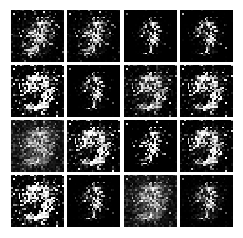

Epoch: 1, Iter: 580, D: 0.3635, G:0.3933


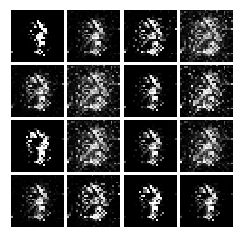

Epoch: 1, Iter: 600, D: 0.1559, G:0.303


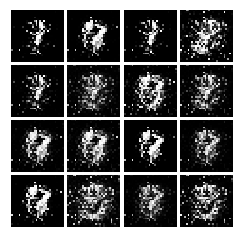

Epoch: 1, Iter: 620, D: 0.1088, G:0.3516


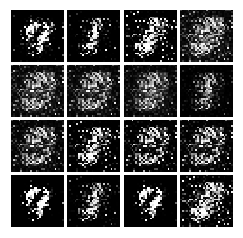

Epoch: 1, Iter: 640, D: 0.1481, G:0.2891


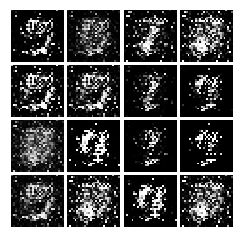

Epoch: 1, Iter: 660, D: 0.1496, G:0.235


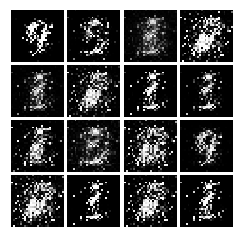

Epoch: 1, Iter: 680, D: 0.1179, G:0.6367


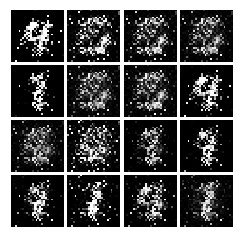

Epoch: 1, Iter: 700, D: 0.104, G:0.3554


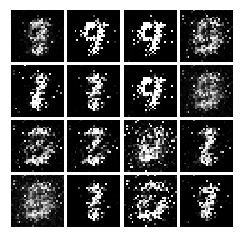

Epoch: 1, Iter: 720, D: 0.2577, G:0.1631


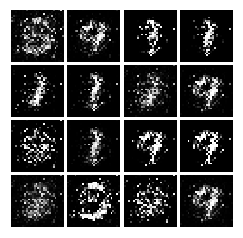

Epoch: 1, Iter: 740, D: 0.1918, G:0.3266


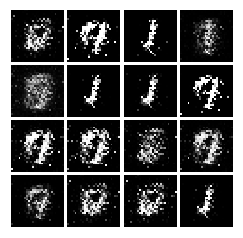

Epoch: 1, Iter: 760, D: 0.1645, G:0.4048


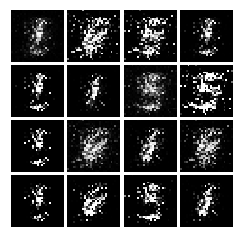

Epoch: 1, Iter: 780, D: 0.1534, G:0.294


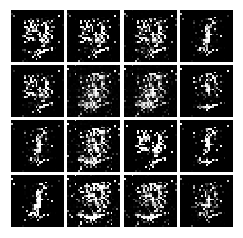

Epoch: 1, Iter: 800, D: 0.1399, G:0.372


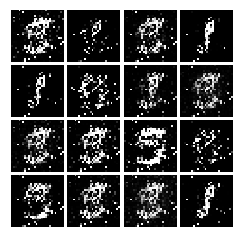

Epoch: 1, Iter: 820, D: 0.0905, G:0.4024


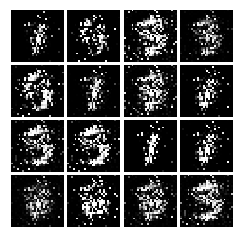

Epoch: 1, Iter: 840, D: 0.1591, G:0.3875


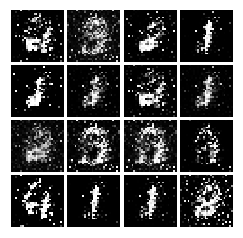

Epoch: 1, Iter: 860, D: 0.1267, G:0.5241


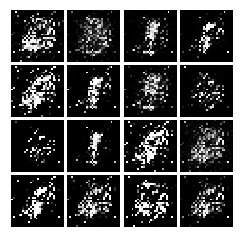

Epoch: 1, Iter: 880, D: 0.1181, G:0.3351


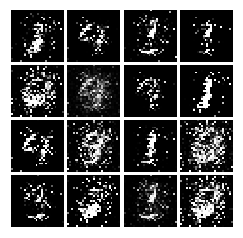

Epoch: 1, Iter: 900, D: 0.1023, G:0.3446


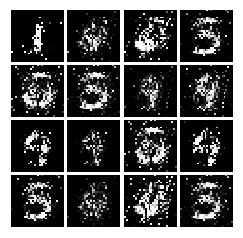

Epoch: 1, Iter: 920, D: 0.2315, G:0.159


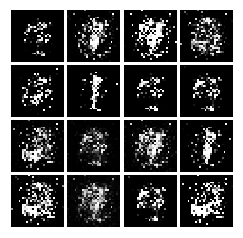

Epoch: 2, Iter: 940, D: 0.151, G:0.3065


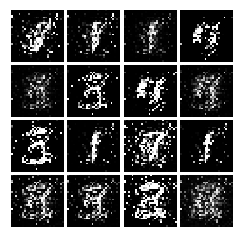

Epoch: 2, Iter: 960, D: 0.146, G:0.9562


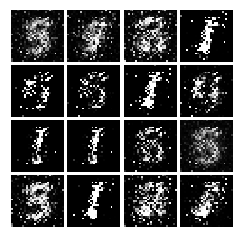

Epoch: 2, Iter: 980, D: 0.1227, G:0.2358


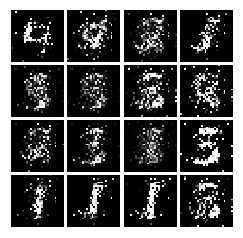

Epoch: 2, Iter: 1000, D: 0.1621, G:0.3752


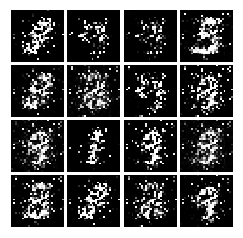

Epoch: 2, Iter: 1020, D: 0.1862, G:0.7928


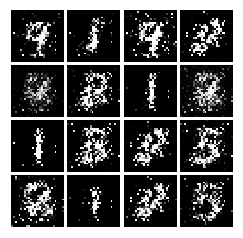

Epoch: 2, Iter: 1040, D: 0.1179, G:0.364


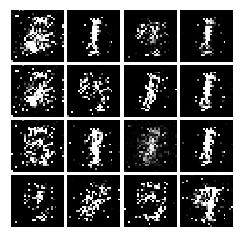

Epoch: 2, Iter: 1060, D: 0.2117, G:1.032


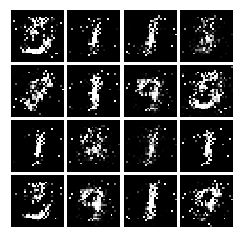

Epoch: 2, Iter: 1080, D: 0.09436, G:0.4563


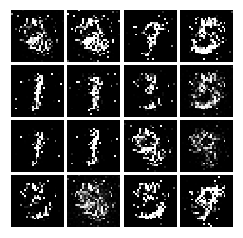

Epoch: 2, Iter: 1100, D: 0.1856, G:0.3116


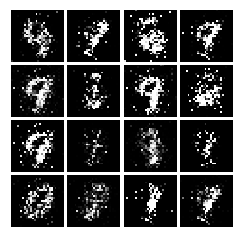

Epoch: 2, Iter: 1120, D: 0.1291, G:0.3343


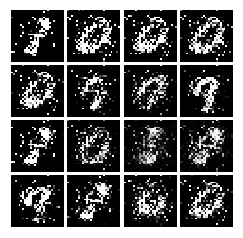

Epoch: 2, Iter: 1140, D: 0.1299, G:0.3139


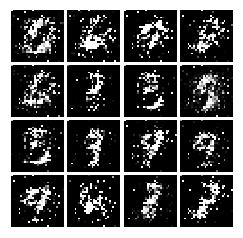

Epoch: 2, Iter: 1160, D: 0.1599, G:0.3103


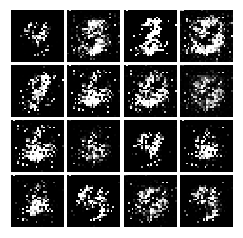

Epoch: 2, Iter: 1180, D: 0.1967, G:0.3149


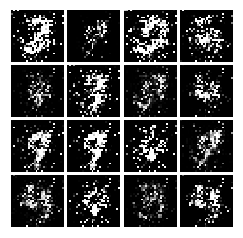

Epoch: 2, Iter: 1200, D: 0.0949, G:0.3574


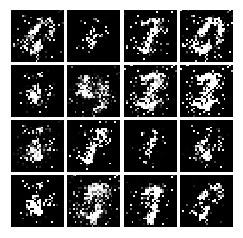

Epoch: 2, Iter: 1220, D: 0.1584, G:0.338


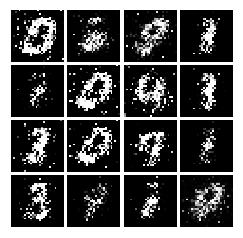

Epoch: 2, Iter: 1240, D: 0.1786, G:0.786


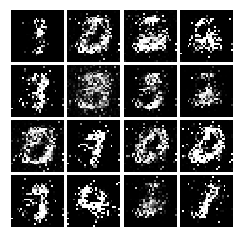

Epoch: 2, Iter: 1260, D: 0.1392, G:0.287


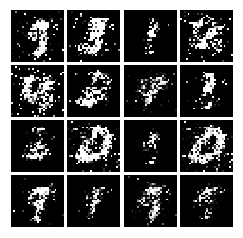

Epoch: 2, Iter: 1280, D: 0.1458, G:0.2605


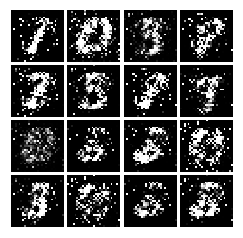

Epoch: 2, Iter: 1300, D: 0.1681, G:0.09299


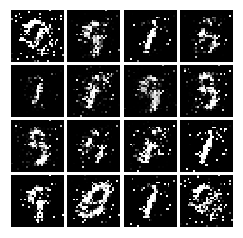

Epoch: 2, Iter: 1320, D: 0.1781, G:0.3891


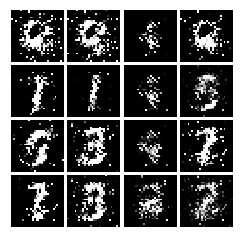

Epoch: 2, Iter: 1340, D: 0.1033, G:0.4097


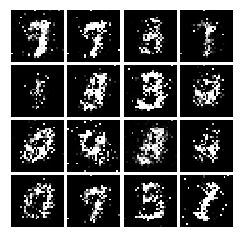

Epoch: 2, Iter: 1360, D: 0.1386, G:0.3059


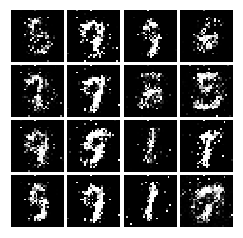

Epoch: 2, Iter: 1380, D: 0.1346, G:0.3302


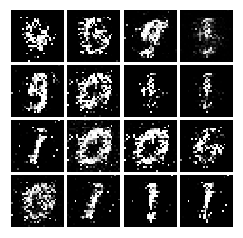

Epoch: 2, Iter: 1400, D: 0.1204, G:0.3809


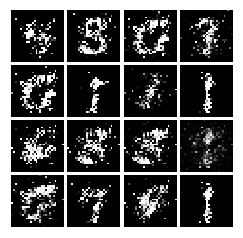

Epoch: 3, Iter: 1420, D: 0.2077, G:0.2229


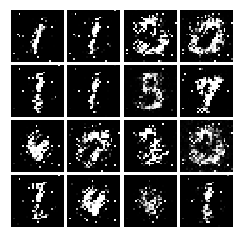

Epoch: 3, Iter: 1440, D: 0.1671, G:0.2563


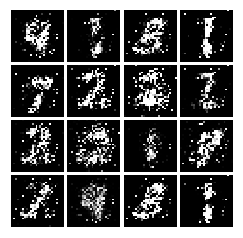

Epoch: 3, Iter: 1460, D: 0.2238, G:0.4335


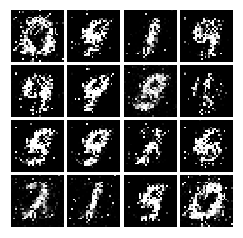

Epoch: 3, Iter: 1480, D: 0.2122, G:0.2266


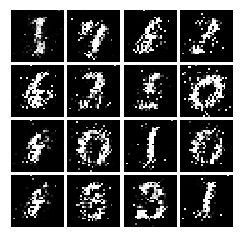

Epoch: 3, Iter: 1500, D: 0.1641, G:0.2091


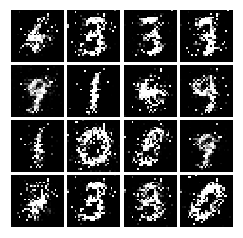

Epoch: 3, Iter: 1520, D: 0.2033, G:0.2607


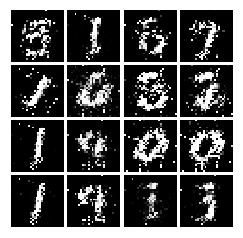

Epoch: 3, Iter: 1540, D: 0.2038, G:0.1926


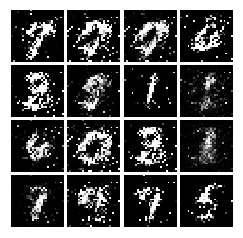

Epoch: 3, Iter: 1560, D: 0.1929, G:0.241


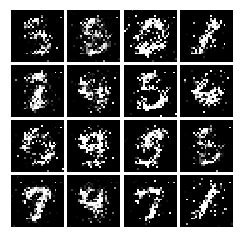

Epoch: 3, Iter: 1580, D: 0.1928, G:0.25


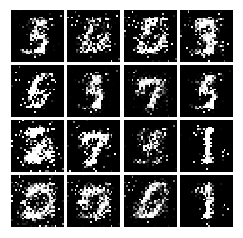

Epoch: 3, Iter: 1600, D: 0.1956, G:0.224


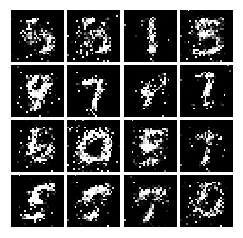

Epoch: 3, Iter: 1620, D: 0.1935, G:0.2153


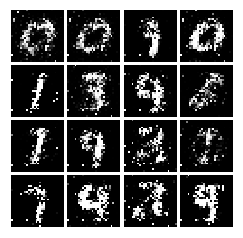

Epoch: 3, Iter: 1640, D: 0.25, G:0.1793


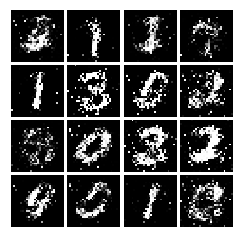

Epoch: 3, Iter: 1660, D: 0.2155, G:0.1799


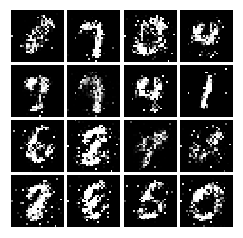

Epoch: 3, Iter: 1680, D: 0.2297, G:0.1577


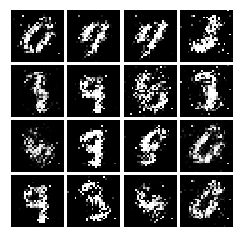

Epoch: 3, Iter: 1700, D: 0.2176, G:0.1698


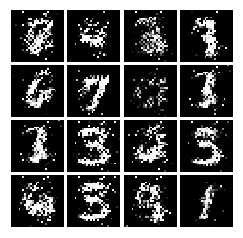

Epoch: 3, Iter: 1720, D: 0.2384, G:0.1584


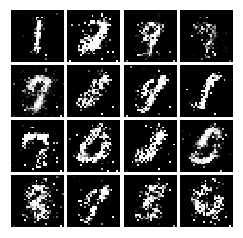

Epoch: 3, Iter: 1740, D: 0.1955, G:0.2193


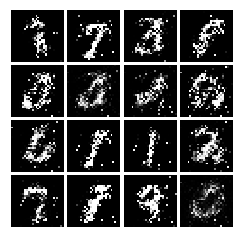

Epoch: 3, Iter: 1760, D: 0.21, G:0.214


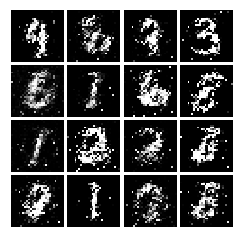

Epoch: 3, Iter: 1780, D: 0.2015, G:0.1927


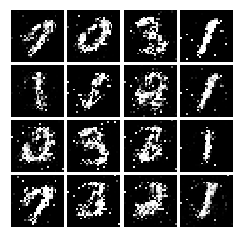

Epoch: 3, Iter: 1800, D: 0.221, G:0.1853


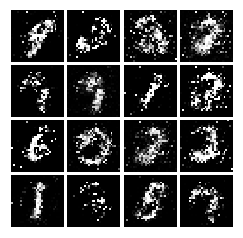

Epoch: 3, Iter: 1820, D: 0.1978, G:0.2226


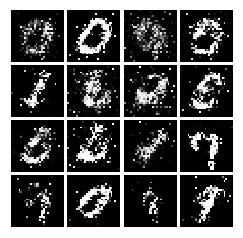

Epoch: 3, Iter: 1840, D: 0.2194, G:0.2306


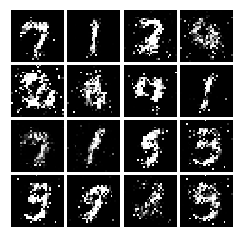

Epoch: 3, Iter: 1860, D: 0.1928, G:0.2702


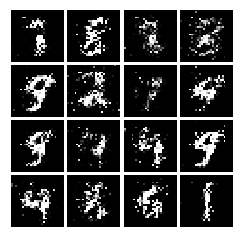

Epoch: 4, Iter: 1880, D: 0.2023, G:0.2265


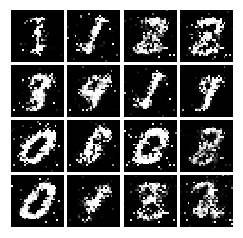

Epoch: 4, Iter: 1900, D: 0.2701, G:0.2385


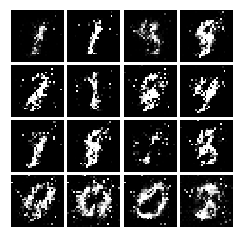

Epoch: 4, Iter: 1920, D: 0.2056, G:0.2001


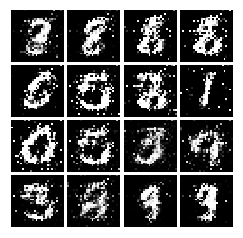

Epoch: 4, Iter: 1940, D: 0.1867, G:0.2232


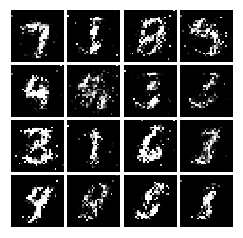

Epoch: 4, Iter: 1960, D: 0.2223, G:0.1967


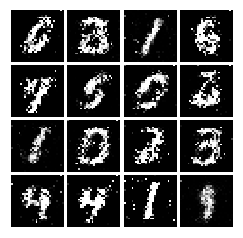

Epoch: 4, Iter: 1980, D: 0.2112, G:0.1706


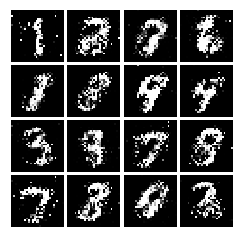

Epoch: 4, Iter: 2000, D: 0.2433, G:0.2118


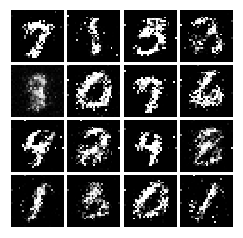

Epoch: 4, Iter: 2020, D: 0.1984, G:0.1853


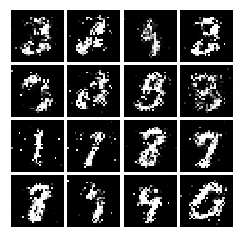

Epoch: 4, Iter: 2040, D: 0.2243, G:0.1776


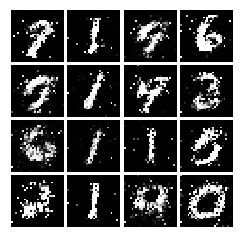

Epoch: 4, Iter: 2060, D: 0.2101, G:0.1707


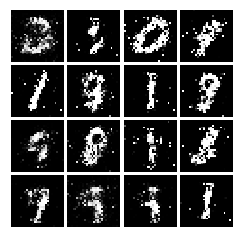

Epoch: 4, Iter: 2080, D: 0.2047, G:0.1937


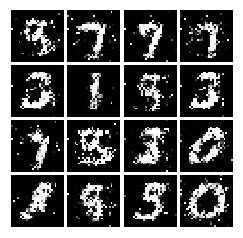

Epoch: 4, Iter: 2100, D: 0.2514, G:0.2056


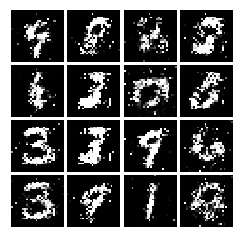

Epoch: 4, Iter: 2120, D: 0.2092, G:0.1635


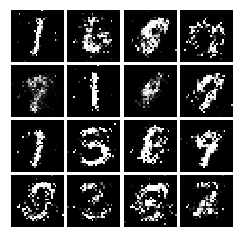

Epoch: 4, Iter: 2140, D: 0.2273, G:0.1795


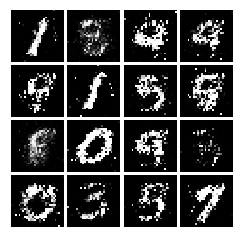

Epoch: 4, Iter: 2160, D: 0.2583, G:0.1957


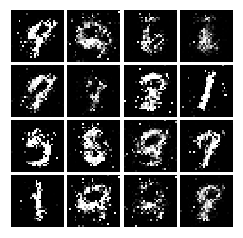

Epoch: 4, Iter: 2180, D: 0.2078, G:0.1933


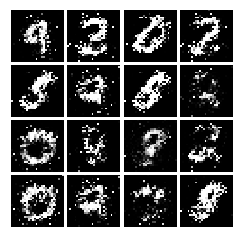

Epoch: 4, Iter: 2200, D: 0.1963, G:0.225


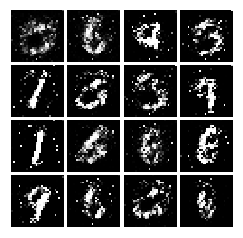

Epoch: 4, Iter: 2220, D: 0.2082, G:0.1822


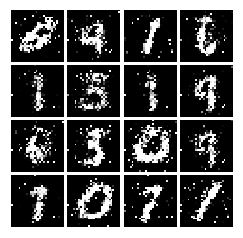

Epoch: 4, Iter: 2240, D: 0.1993, G:0.1947


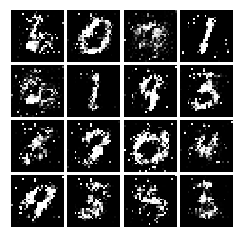

Epoch: 4, Iter: 2260, D: 0.2073, G:0.2131


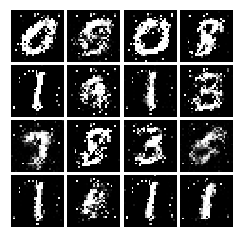

Epoch: 4, Iter: 2280, D: 0.225, G:0.1837


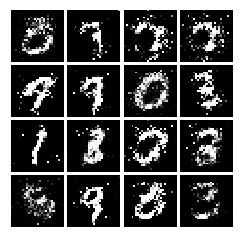

Epoch: 4, Iter: 2300, D: 0.224, G:0.1871


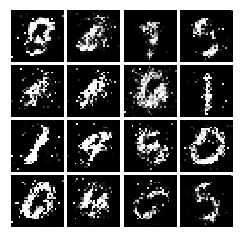

Epoch: 4, Iter: 2320, D: 0.2279, G:0.163


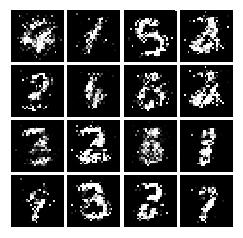

Epoch: 4, Iter: 2340, D: 0.1667, G:0.2573


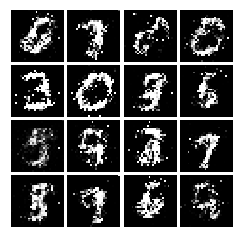

Epoch: 5, Iter: 2360, D: 0.1941, G:0.1905


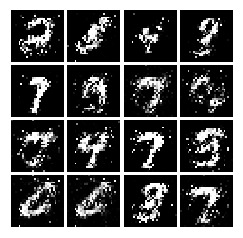

Epoch: 5, Iter: 2380, D: 0.2084, G:0.2048


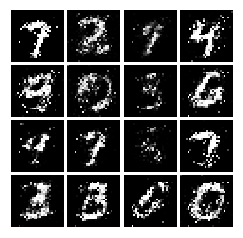

Epoch: 5, Iter: 2400, D: 0.2003, G:0.1918


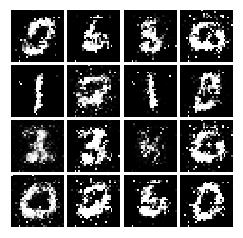

Epoch: 5, Iter: 2420, D: 0.2034, G:0.1521


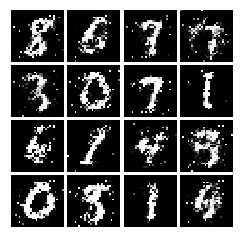

Epoch: 5, Iter: 2440, D: 0.2053, G:0.1821


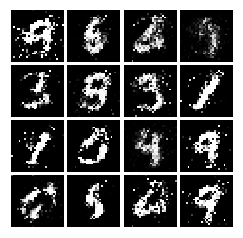

Epoch: 5, Iter: 2460, D: 0.1778, G:0.2413


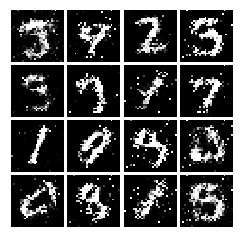

Epoch: 5, Iter: 2480, D: 0.2123, G:0.2012


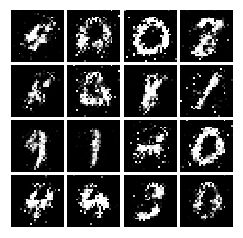

Epoch: 5, Iter: 2500, D: 0.1875, G:0.1903


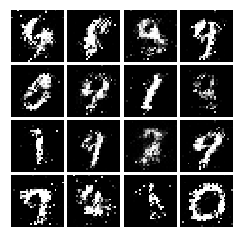

Epoch: 5, Iter: 2520, D: 0.2608, G:0.1968


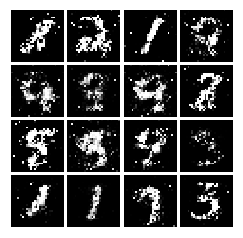

Epoch: 5, Iter: 2540, D: 0.2283, G:0.1963


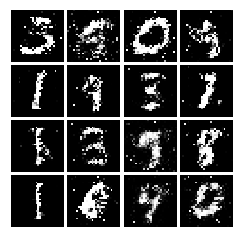

Epoch: 5, Iter: 2560, D: 0.2136, G:0.1834


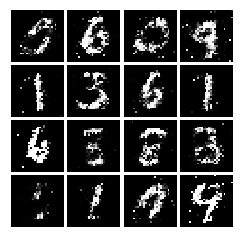

Epoch: 5, Iter: 2580, D: 0.2218, G:0.2015


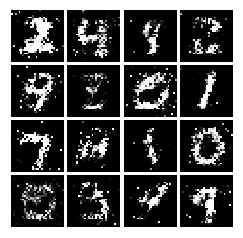

Epoch: 5, Iter: 2600, D: 0.2412, G:0.18


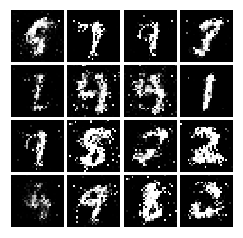

Epoch: 5, Iter: 2620, D: 0.2142, G:0.2462


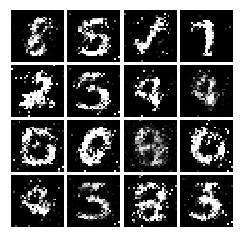

Epoch: 5, Iter: 2640, D: 0.2269, G:0.1658


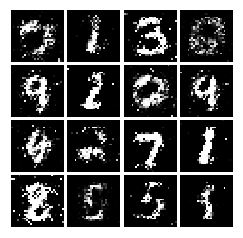

Epoch: 5, Iter: 2660, D: 0.2153, G:0.17


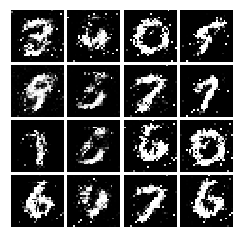

Epoch: 5, Iter: 2680, D: 0.227, G:0.404


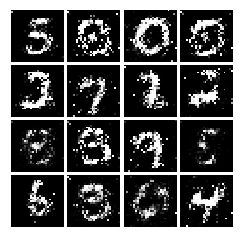

Epoch: 5, Iter: 2700, D: 0.2432, G:0.1935


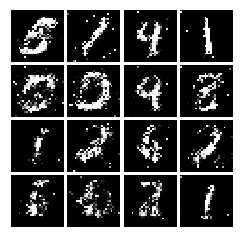

Epoch: 5, Iter: 2720, D: 0.2107, G:0.1623


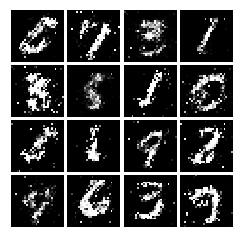

Epoch: 5, Iter: 2740, D: 0.2294, G:0.1746


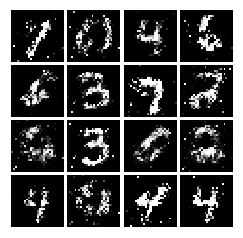

Epoch: 5, Iter: 2760, D: 0.2282, G:0.1564


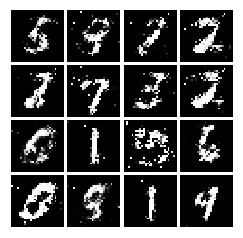

Epoch: 5, Iter: 2780, D: 0.2241, G:0.1593


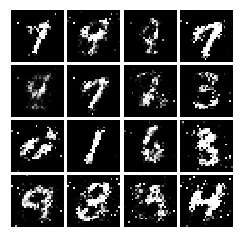

Epoch: 5, Iter: 2800, D: 0.202, G:0.1741


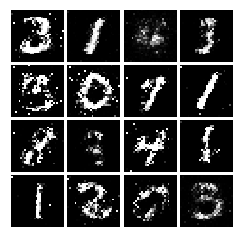

Epoch: 6, Iter: 2820, D: 0.2287, G:0.1862


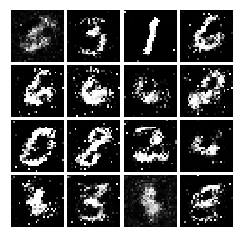

Epoch: 6, Iter: 2840, D: 0.2234, G:0.1747


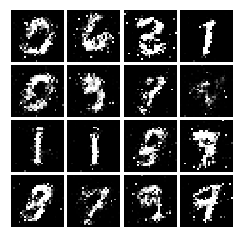

Epoch: 6, Iter: 2860, D: 0.1896, G:0.1771


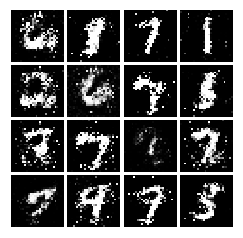

Epoch: 6, Iter: 2880, D: 0.2168, G:0.1739


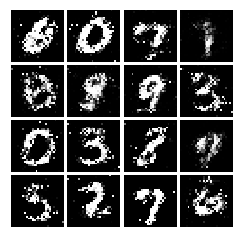

Epoch: 6, Iter: 2900, D: 0.229, G:0.1824


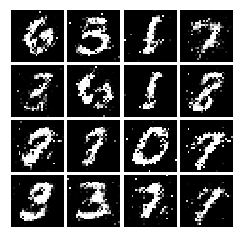

Epoch: 6, Iter: 2920, D: 0.2283, G:0.1807


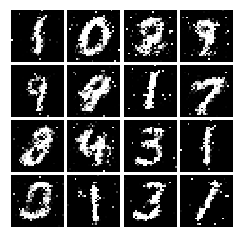

Epoch: 6, Iter: 2940, D: 0.2344, G:0.1819


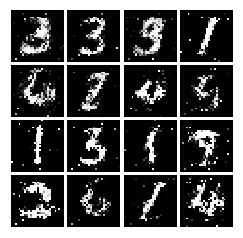

Epoch: 6, Iter: 2960, D: 0.2107, G:0.163


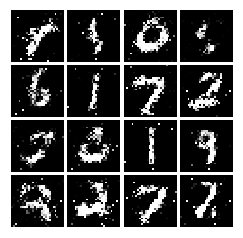

Epoch: 6, Iter: 2980, D: 0.2333, G:0.1528


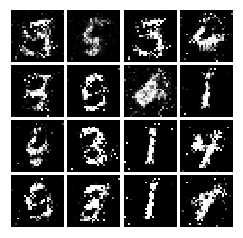

Epoch: 6, Iter: 3000, D: 0.2165, G:0.1759


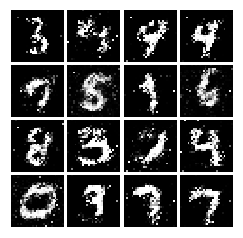

Epoch: 6, Iter: 3020, D: 0.236, G:0.1715


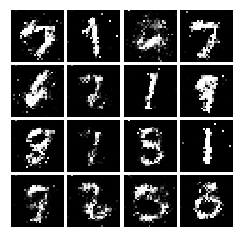

Epoch: 6, Iter: 3040, D: 0.2331, G:0.2136


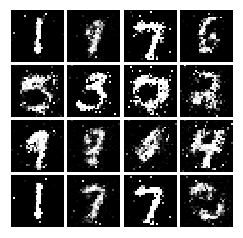

Epoch: 6, Iter: 3060, D: 0.2458, G:0.1583


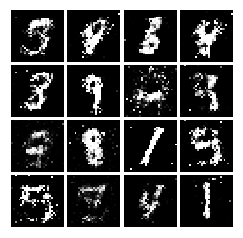

Epoch: 6, Iter: 3080, D: 0.2463, G:0.1649


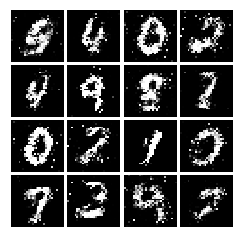

Epoch: 6, Iter: 3100, D: 0.2218, G:0.1843


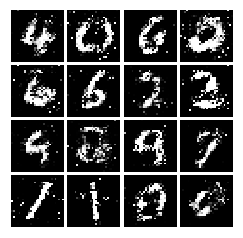

Epoch: 6, Iter: 3120, D: 0.2131, G:0.1679


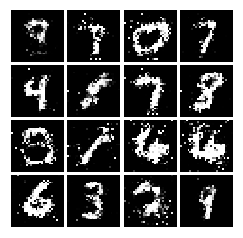

Epoch: 6, Iter: 3140, D: 0.2441, G:0.1916


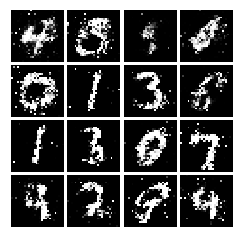

Epoch: 6, Iter: 3160, D: 0.2362, G:0.1712


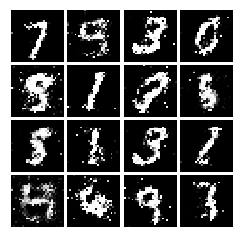

Epoch: 6, Iter: 3180, D: 0.222, G:0.1777


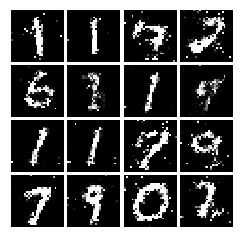

Epoch: 6, Iter: 3200, D: 0.2405, G:0.1991


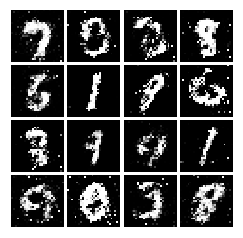

Epoch: 6, Iter: 3220, D: 0.2161, G:0.181


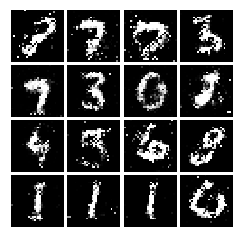

Epoch: 6, Iter: 3240, D: 0.2196, G:0.1397


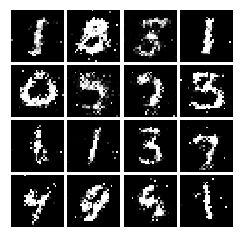

Epoch: 6, Iter: 3260, D: 0.2398, G:0.1447


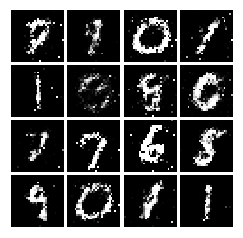

Epoch: 6, Iter: 3280, D: 0.26, G:0.1765


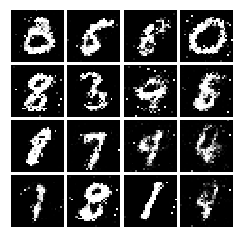

Epoch: 7, Iter: 3300, D: 0.2328, G:0.1881


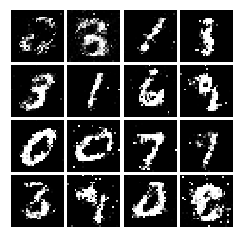

Epoch: 7, Iter: 3320, D: 0.219, G:0.1783


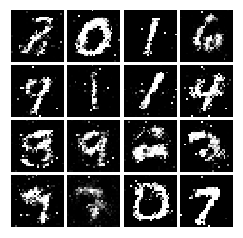

Epoch: 7, Iter: 3340, D: 0.2246, G:0.1765


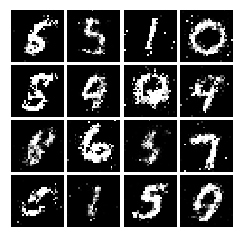

Epoch: 7, Iter: 3360, D: 0.2728, G:0.1924


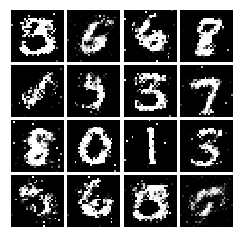

Epoch: 7, Iter: 3380, D: 0.2239, G:0.1553


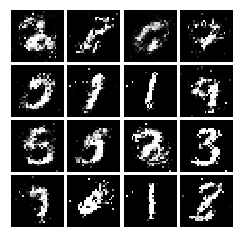

Epoch: 7, Iter: 3400, D: 0.2245, G:0.1671


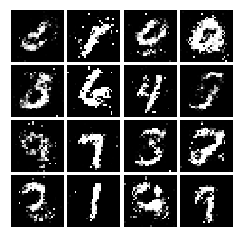

Epoch: 7, Iter: 3420, D: 0.2327, G:0.1684


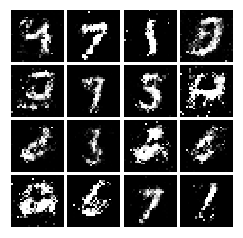

Epoch: 7, Iter: 3440, D: 0.2303, G:0.1669


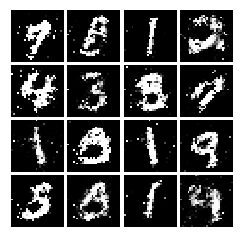

Epoch: 7, Iter: 3460, D: 0.2251, G:0.1722


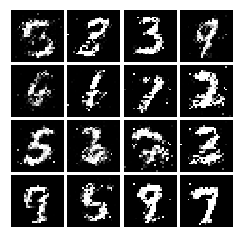

Epoch: 7, Iter: 3480, D: 0.2129, G:0.1779


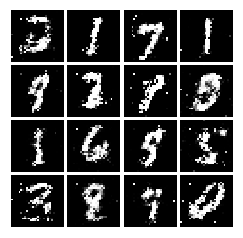

Epoch: 7, Iter: 3500, D: 0.2129, G:0.1705


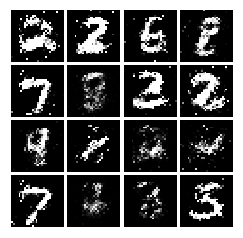

Epoch: 7, Iter: 3520, D: 0.239, G:0.1762


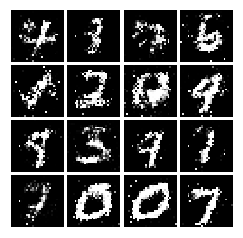

Epoch: 7, Iter: 3540, D: 0.2246, G:0.1624


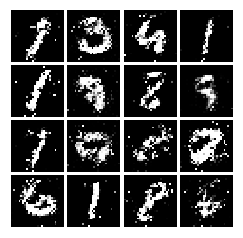

Epoch: 7, Iter: 3560, D: 0.204, G:0.1908


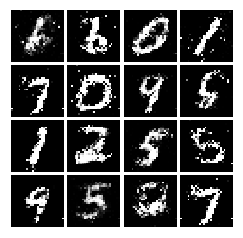

Epoch: 7, Iter: 3580, D: 0.2437, G:0.1635


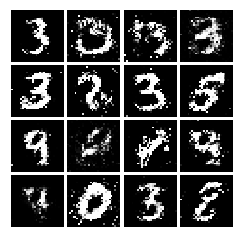

Epoch: 7, Iter: 3600, D: 0.2284, G:0.1576


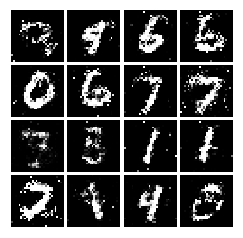

Epoch: 7, Iter: 3620, D: 0.2264, G:0.1737


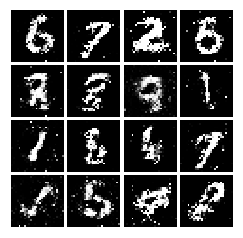

Epoch: 7, Iter: 3640, D: 0.2333, G:0.1842


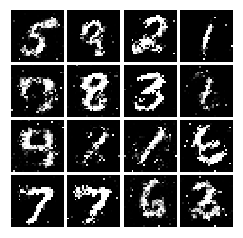

Epoch: 7, Iter: 3660, D: 0.2144, G:0.1654


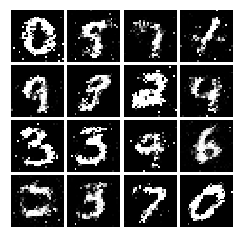

Epoch: 7, Iter: 3680, D: 0.2372, G:0.1446


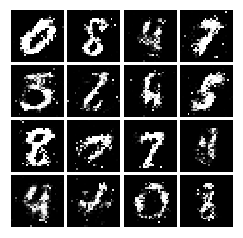

Epoch: 7, Iter: 3700, D: 0.2188, G:0.1585


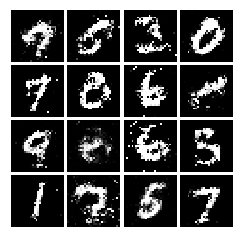

Epoch: 7, Iter: 3720, D: 0.2221, G:0.1812


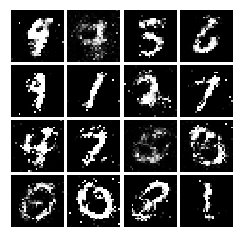

Epoch: 7, Iter: 3740, D: 0.2538, G:0.1665


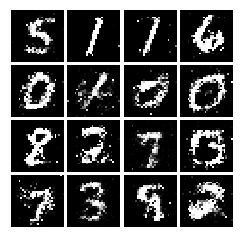

Epoch: 8, Iter: 3760, D: 0.2362, G:0.1792


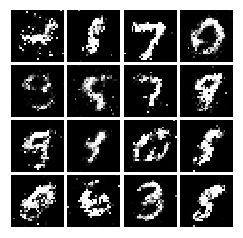

Epoch: 8, Iter: 3780, D: 0.2522, G:0.1641


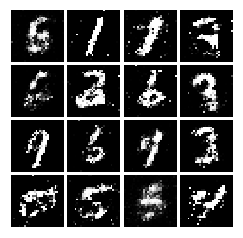

Epoch: 8, Iter: 3800, D: 0.2219, G:0.1568


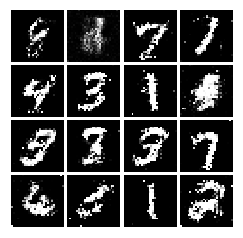

Epoch: 8, Iter: 3820, D: 0.214, G:0.1779


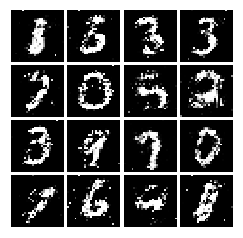

Epoch: 8, Iter: 3840, D: 0.2269, G:0.1681


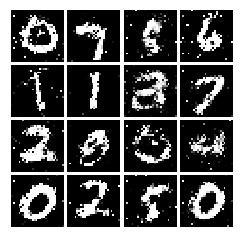

Epoch: 8, Iter: 3860, D: 0.2381, G:0.164


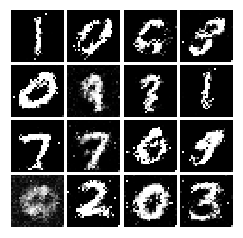

Epoch: 8, Iter: 3880, D: 0.2271, G:0.1604


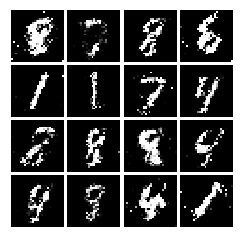

Epoch: 8, Iter: 3900, D: 0.2322, G:0.1718


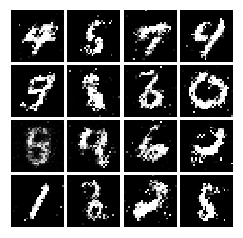

Epoch: 8, Iter: 3920, D: 0.2276, G:0.1652


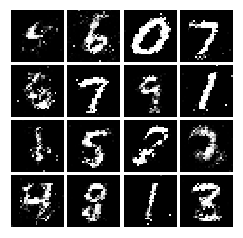

Epoch: 8, Iter: 3940, D: 0.2393, G:0.1532


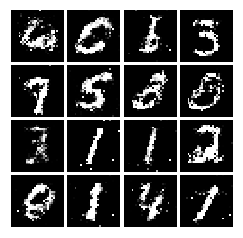

Epoch: 8, Iter: 3960, D: 0.2256, G:0.1805


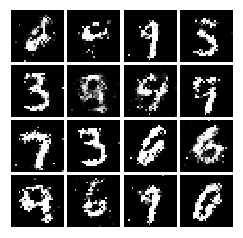

Epoch: 8, Iter: 3980, D: 0.2289, G:0.1651


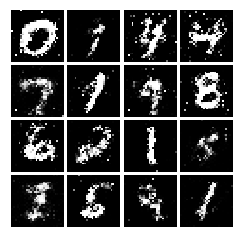

Epoch: 8, Iter: 4000, D: 0.213, G:0.1865


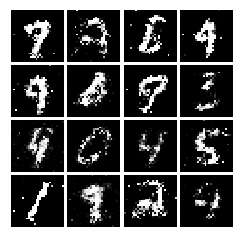

Epoch: 8, Iter: 4020, D: 0.2449, G:0.1621


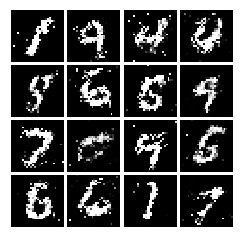

Epoch: 8, Iter: 4040, D: 0.2214, G:0.1717


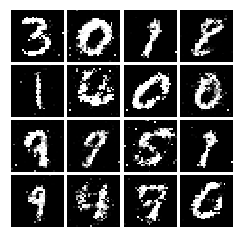

Epoch: 8, Iter: 4060, D: 0.2184, G:0.1564


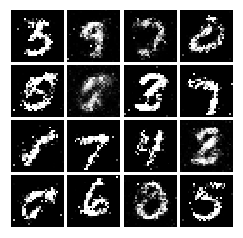

Epoch: 8, Iter: 4080, D: 0.2495, G:0.1547


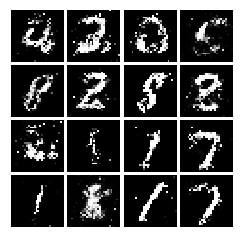

Epoch: 8, Iter: 4100, D: 0.2329, G:0.1729


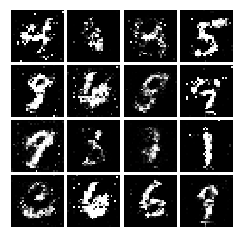

Epoch: 8, Iter: 4120, D: 0.2549, G:0.1644


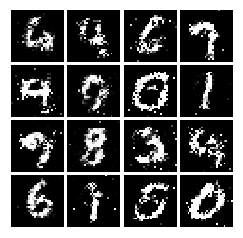

Epoch: 8, Iter: 4140, D: 0.222, G:0.1729


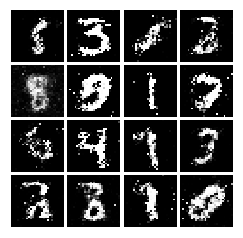

Epoch: 8, Iter: 4160, D: 0.2347, G:0.1728


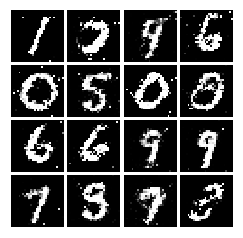

Epoch: 8, Iter: 4180, D: 0.2405, G:0.1607


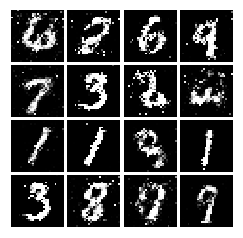

Epoch: 8, Iter: 4200, D: 0.2275, G:0.1661


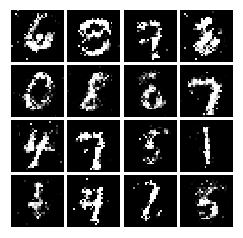

Epoch: 8, Iter: 4220, D: 0.2301, G:0.188


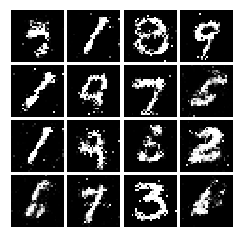

Epoch: 9, Iter: 4240, D: 0.2359, G:0.1377


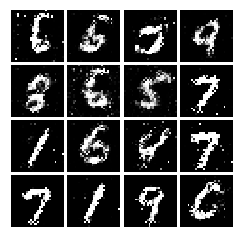

Epoch: 9, Iter: 4260, D: 0.2424, G:0.1657


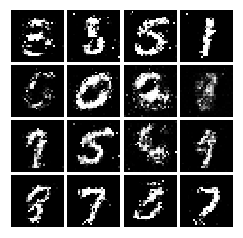

Epoch: 9, Iter: 4280, D: 0.236, G:0.1525


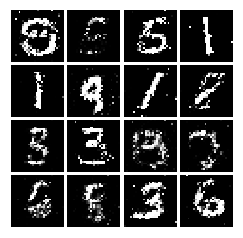

Epoch: 9, Iter: 4300, D: 0.2345, G:0.1718


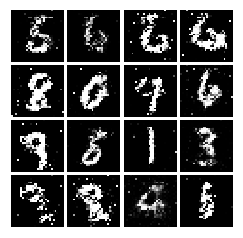

Epoch: 9, Iter: 4320, D: 0.2332, G:0.1602


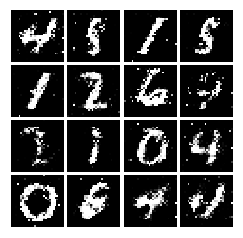

Epoch: 9, Iter: 4340, D: 0.2295, G:0.1645


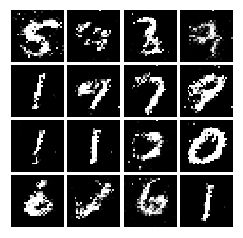

Epoch: 9, Iter: 4360, D: 0.2404, G:0.1885


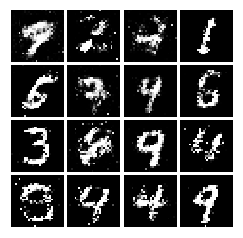

Epoch: 9, Iter: 4380, D: 0.2477, G:0.1617


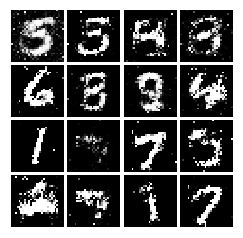

Epoch: 9, Iter: 4400, D: 0.2151, G:0.1855


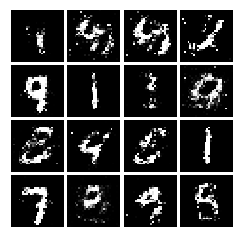

Epoch: 9, Iter: 4420, D: 0.2254, G:0.147


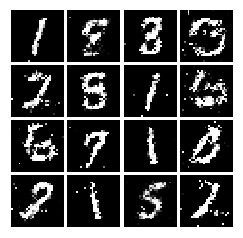

Epoch: 9, Iter: 4440, D: 0.24, G:0.1607


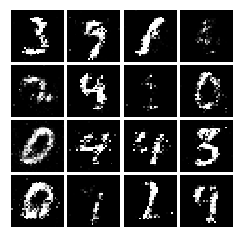

Epoch: 9, Iter: 4460, D: 0.2332, G:0.1737


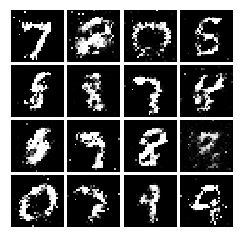

Epoch: 9, Iter: 4480, D: 0.2385, G:0.1543


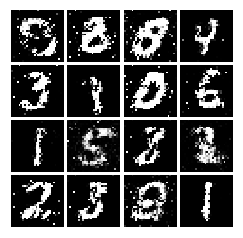

Epoch: 9, Iter: 4500, D: 0.2506, G:0.1527


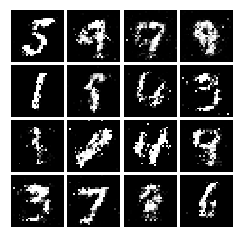

Epoch: 9, Iter: 4520, D: 0.2495, G:0.1533


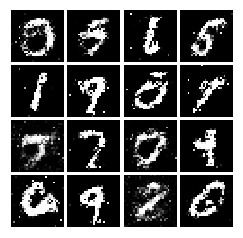

Epoch: 9, Iter: 4540, D: 0.2379, G:0.1607


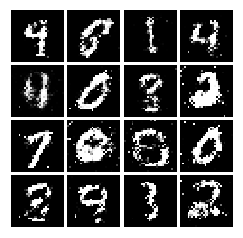

Epoch: 9, Iter: 4560, D: 0.2332, G:0.1823


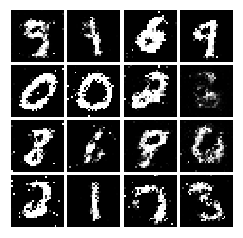

Epoch: 9, Iter: 4580, D: 0.2207, G:0.1849


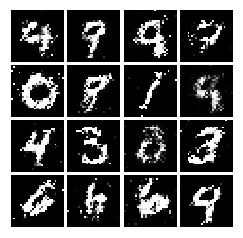

Epoch: 9, Iter: 4600, D: 0.2626, G:0.158


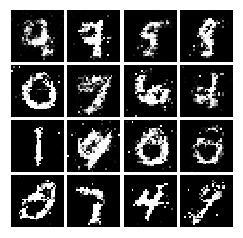

Epoch: 9, Iter: 4620, D: 0.2654, G:0.1524


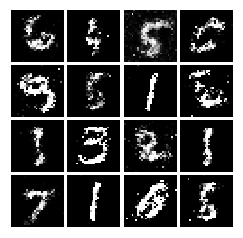

Epoch: 9, Iter: 4640, D: 0.2292, G:0.1839


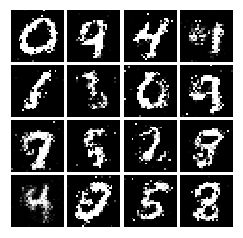

Epoch: 9, Iter: 4660, D: 0.2352, G:0.1556


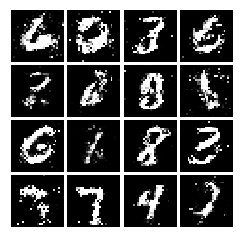

Epoch: 9, Iter: 4680, D: 0.2361, G:0.1643


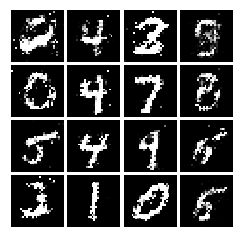

Final images


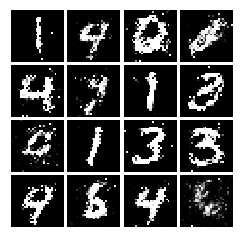

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
        tf.keras.layers.InputLayer((28, 28, 1)),
        tf.keras.layers.Conv2D(filters=32, kernel_size=(5, 5), strides=1, padding='valid'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
        tf.keras.layers.Conv2D(filters=64, kernel_size=(5, 5), strides=1, padding='valid'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D(pool_size=2, strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """

    
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x1 = tf.keras.layers.Input(noise_dim,)
    x = tf.keras.layers.Dense(1024, activation='relu')(x1)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dense(7*7*128, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Reshape((7, 7, 128))(x)
    x = tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=(4, 4), strides=2, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    output = tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=(4, 4), strides=2, activation='tanh')(x)
    model = tf.keras.Model(inputs=x1, outputs=output)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
   
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=3)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2    |  1     |  -1     |   -2    |   -1    |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -1    |   -2    |   -1    |   1    |   2    |   1    
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
We can notice a cycle here which will repeat itself every 6 iterations and therefore it's not possible to reach the optimal values of x and y


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 

No, it is not a good sign, since the discriminator is not learning to recoginse real samples from noisy images. So even if the generator model is constantly producing noisy images, it is possible for the generator to fool the discriminator.
